In [270]:
# import the necessary packages
import numpy as np
import cv2
from matplotlib import pyplot as plt
import imutils
import math
import time

In [271]:
from os import listdir
from os.path import isfile, join
images_paths = sorted([f for f in listdir('../images') if isfile(join('../images', f))])

In [272]:
def detect_roi(image, visualize_bounding_box=False):
    """Detect the ROI surrounding the barcode in the given image.

    It returns the bounding box coordinates. In addition, it warps the bounding box, in order to rotate it and making the 
    bars perfectly vertical.

    This works both if the barcode is non-rotated (i.e. the bars are vertical) and if the barcode is rotated (i.e. the bars 
    are horizontal). 

    Parameters
    ----------
    image : np.array
        Input image.
    visualize_bounding_box : bool, optional
        Whether to visualize or not the input image with the detected bounding box, by default False
    visualize_final_image : bool, optional
        Whether to visualize or not the warped bounding box, by default False

    Returns
    -------
    bb_sorted : np.array
        Array 4x2, containing the coordinates of the four bounding box points. 
        The points are ordered in the following way: up-left, up-right, bottom-left, bottom-right.
    
    bb_image_warped : np.array
        Image representing the warped bounding box: the barcode bars are perfectly vertical.

    rotated : bool
        Whether the barcode was non-rotated (i.e. the bars were vertical) or rotated (i.e. the bars were horizontal).

    """

    # Convert the image to grey scale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Compute both the horizontal and vertical derivative, using the Sobel filter
    ddepth = cv2.cv.CV_32F if imutils.is_cv2() else cv2.CV_32F
    gradX = cv2.Sobel(gray, ddepth=ddepth, dx=1, dy=0, ksize=-1)
    gradY = cv2.Sobel(gray, ddepth=ddepth, dx=0, dy=1, ksize=-1)
    # Subtract the y-gradient from the x-gradient: we get the final gradient image
    gradient = cv2.subtract(gradX, gradY)
    gradient = cv2.convertScaleAbs(gradient)

    # Blur the gradient image    
    blurred = cv2.blur(gradient, (9, 9))

    # Threshold the gradient image
    _ ,thresh = cv2.threshold(blurred,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    # Closing: fill the bounding box
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    
    # Opening: remove small things outside
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 50))
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)
    
    # Dilate: slight enlarge the box
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (8, 8))
    dilated = cv2.dilate(opened, kernel, iterations=3)
    
    # Find the bounding box (OpenCV API)
    cnts = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = sorted(cnts, key = cv2.contourArea, reverse = True)[0]
    # Compute the rotated bounding box of the largest contour
    rect = cv2.minAreaRect(c)
    box = cv2.cv.BoxPoints(rect) if imutils.is_cv2() else cv2.boxPoints(rect)
    # This is our bounding box: 4 points, each of them 2 coordinates
    box = np.int0(box)  

    if visualize_bounding_box:
        # Draw a bounding box around the detected barcode and display the image
        image_bb = image.copy()
        cv2.drawContours(image_bb, [box], -1, (0, 255, 0), 3)
        plt.figure()
        plt.imshow(image_bb, 'gray')
        plt.title('Original image, with the bounding box')
    
    # Sorting the points of the bounding box, such that they follow the ordering: up-left, up-right, bottom-left, bottom-right.
    bb_sorted = box.astype('float32')
    min_width = bb_sorted[:,0].min()
    min_height = bb_sorted[:,1].min()
    max_width = bb_sorted[:,0].max()
    max_height = bb_sorted[:,1].max()
    def normalize(value, axis=0):
        if axis==0:  # Horizontal dimension
            return min_width if (value-min_width<max_width-value) \
                             else max_width
        elif axis==1:  # Vertical dimension
            return min_height if (value-min_height<max_height-value) \
                              else max_height
    bb_sorted = np.array(sorted([tuple(v) for v in bb_sorted], key=lambda t: (normalize(t[1], axis=1),
                                                                                                normalize(t[0], axis=0))))
    
    # Compute the width and height of the bounding box.
    def dist(point1, point2):
        return np.sqrt(np.sum((point1-point2)**2))
    bb_height = int(max([dist(bb_sorted[0],bb_sorted[2]),
                             dist(bb_sorted[1],bb_sorted[3])]))
    bb_width = int(max([dist(bb_sorted[0],bb_sorted[1]),
                             dist(bb_sorted[2],bb_sorted[3])]))


    return bb_sorted, bb_width, bb_height

In [273]:
def rotate_image(image, angle, center):
  #image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result, rot_mat

In [274]:
def rotate_image_boundingBox(image, bb_sorted, bb_width, bb_height):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    point1 = bb_sorted[0, :]
    point2 = bb_sorted[1, :]
    point3 = bb_sorted[2, :]
    point4 = bb_sorted[3, :]
    
    angle = math.degrees(math.atan((point2[1]-point1[1])/(point2[0]-point1[0])))
    """ TODO : CONSIDER THE OTHER ANGLES?
    angle2 = abs(math.degrees(math.atan((point4[1]-point3[1])/(point4[0]-point3[0]))))
    #print(angle2)
    angle3 = 90-abs(math.degrees(math.atan((point1[1]-point3[1])/(point1[0]-point3[0]))))
    #print(angle3)
    angle4 = 90-abs(math.degrees(math.atan((point2[1]-point4[1])/(point2[0]-point4[0]))))
    #print(angle4)"""
    
    if abs(angle)<10**(-4):
        gray_rot, image_rot, bb_sorted_rot = gray, image, bb_sorted
    
    else:
        gray_rot, rot_mat = rotate_image(gray, angle=angle, center=point1)
        """plt.figure()
        plt.imshow(gray_rot, 'gray')
        plt.title('Rotated image')"""

        bb_sorted_rot = np.array([point1,
                              [point1[0]+bb_width-1,point1[1]],
                              [point1[0],point1[1]+bb_height-1],
                              [point1[0]+bb_width-1,point1[1]+bb_height-1]], dtype='float32') 
        
        image_rot, rot_mat = rotate_image(image, angle=angle, center=point1)
        
    bb_rot = bb_sorted_rot.copy()
    bb_rot[2, :] = bb_sorted_rot[3, :]
    bb_rot[3, :] = bb_sorted_rot[2, :]

    image_rot_bb = image_rot.copy()
    cv2.drawContours(image_rot_bb, [bb_rot.astype(int)], -1, (0, 255, 0), 3)
    plt.figure()
    plt.imshow(image_rot_bb, 'gray')
    plt.title('Rotated image, with the rotated bounding box')
    
    return image_rot, gray_rot, bb_sorted_rot, bb_rot

In [275]:
def fix_horizontal_barcode_case(image_rot, gray_rot, roi_image, bb_sorted_rot, bb_rot, bb_width, bb_height):
    # Understand if the barcode is rotated (i.e. horizontal bars) or not.
    # For doing so, we compute the horizontal and vertical gradient images: if the sum on the latter is bigger than the sum 
    # on the former, this means that the barcode is rotated.
    ddepth = cv2.cv.CV_32F if imutils.is_cv2() else cv2.CV_32F
    gradX = cv2.Sobel(roi_image, ddepth=ddepth, dx=1, dy=0, ksize=-1)
    gradY = cv2.Sobel(roi_image, ddepth=ddepth, dx=0, dy=1, ksize=-1)
    rotated = cv2.convertScaleAbs(gradY).sum()>cv2.convertScaleAbs(gradX).sum()

    height, width = gray_rot.shape

    # If the barcode is rotate, we must rotate the warped image accordingly.
    # We perform the rotation by applying a warping/homography.
    if not rotated:
        return image_rot, gray_rot, bb_width, bb_height, bb_sorted_rot, bb_rot, roi_image
    
    coordinates_source = np.array([[0, 0],
                                   [width-1, 0],
                                   [0, height-1],
                                   [width-1, height-1]], dtype='float32')

    destination_height, destination_width = width, height
    coordinates_destination = np.array([[destination_width-1, 0],
                                            [destination_width-1, destination_height-1],
                                            [0, 0],                                        
                                            [0, destination_height-1]], dtype='float32')

    # Computing the trasformation, i.e. homography/warping. It's a rotation
    H = cv2.getPerspectiveTransform(coordinates_source, coordinates_destination)

    # Applying the trasformation: we rotate the warped image
    gray_rot_rot = cv2.warpPerspective(gray_rot, H, (destination_width, destination_height))

    image_rot_rot = cv2.warpPerspective(image_rot, H, (destination_width, destination_height))
        
    bb_sorted_rot_rot = cv2.perspectiveTransform(bb_sorted_rot.reshape(-1,1,2),H)
    bb_sorted_rot_rot = bb_sorted_rot_rot[:,0,:]
    
    min_width = bb_sorted_rot_rot[:,0].min()
    min_height = bb_sorted_rot_rot[:,1].min()
    max_width = bb_sorted_rot_rot[:,0].max()
    max_height = bb_sorted_rot_rot[:,1].max()
    def normalize(value, axis=0):
        if axis==0:  # Horizontal dimension
            return min_width if (value-min_width<max_width-value) \
                             else max_width
        elif axis==1:  # Vertical dimension
            return min_height if (value-min_height<max_height-value) \
                              else max_height
    bb_sorted_rot_rot = np.array(sorted([tuple(v) for v in bb_sorted_rot_rot], key=lambda t: (normalize(t[1], axis=1),
                                                                                                normalize(t[0], axis=0))))
    
    bb_rot_rot = bb_sorted_rot_rot.copy()
    bb_rot_rot[2, :] = bb_sorted_rot_rot[3, :]
    bb_rot_rot[3, :] = bb_sorted_rot_rot[2, :]
    
    roi_image_rot = gray_rot_rot[int(bb_sorted_rot_rot[0][1]):int(bb_sorted_rot_rot[0][1]+bb_width), int(bb_sorted_rot_rot[0][0]):int(bb_sorted_rot_rot[0][0]+bb_height)]
    
    gray_rot = gray_rot_rot
    image_rot = image_rot_rot
    bb_width, bb_height = bb_height, bb_width
    bb_sorted_rot = bb_sorted_rot_rot
    bb_rot = bb_rot_rot
    roi_image = roi_image_rot
    
    return image_rot, gray_rot, bb_width, bb_height, bb_sorted_rot, bb_rot, roi_image

In [276]:
def computing_roi_quantities(roi_image, bb_width, bb_height):
    _ ,thresh = cv2.threshold(roi_image,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    half_height = int(bb_height/2)
    
    first_bar_found = False
    X = bb_width

    min_half_height_up = half_height
    min_half_height_bottom = half_height

    i = 0
    while i<bb_width:
        if thresh[half_height, i]==255:
            #print('W', end='')
            i += 1
            continue

        #print('B', end='')
        if not first_bar_found:
            first_bar_x = i
            first_bar_found = True 

        X_curr = 1
        j = i+1
        while thresh[half_height, j]==0:
            #print('B', end='')
            X_curr += 1
            j += 1

        j_up = half_height-1
        j_bottom = half_height+1
        min_half_height_up_curr = 1
        min_half_height_bottom_curr = 1

        up_reached = False
        bottom_reached = False

        while not up_reached or not bottom_reached:
            X_tmp_up = X_curr
            X_tmp_bottom = X_curr

            if not up_reached:
                while thresh[j_up, j]==0:
                    X_tmp_up += 1
                    j +=1 
            if not bottom_reached:
                while thresh[j_bottom, j]==0:
                    X_tmp_bottom += 1
                    j +=1 
            X_curr = max([X_tmp_up,X_tmp_bottom])

            up_reached = j_up<=0 or np.all(thresh[j_up, i:j]==255)
            if X_curr==1:
               foreground_perc_points = (thresh[0:j_up, i]==0).sum()/thresh[0:j_up, i].shape[0]
               #print('Up', foreground_perc_points)
               up_reached = j_up<=0 or foreground_perc_points<0.1
            if not up_reached:
                j_up -= 1
                min_half_height_up_curr += 1

            bottom_reached = j_bottom>=bb_height-1 or np.all(thresh[j_bottom, i:j]==255)
            if X_curr==1:
               #bottom_reached = j_bottom>=bb_height-1 or np.all(thresh[j_bottom+1:min([bb_height-1,j_bottom+4]), i]==255)
               foreground_perc_points = (thresh[j_bottom:, i]==0).sum()/thresh[j_bottom:, i].shape[0]
               #print('Bottom', foreground_perc_points)
               bottom_reached = j_bottom>=bb_height-1 or foreground_perc_points<0.1
            if not bottom_reached:
                j_bottom += 1
                min_half_height_bottom_curr += 1

        if X_curr<X:
            X = X_curr

        if min_half_height_up_curr<min_half_height_up:
            min_half_height_up = min_half_height_up_curr

        if min_half_height_bottom_curr<min_half_height_bottom:
            min_half_height_bottom = min_half_height_bottom_curr

        i = j

    last_bar_x = j - 1
    
    return first_bar_x, last_bar_x, X, min_half_height_up, min_half_height_bottom 

In [336]:
def refine_roi(image_path):
    start_time = time.time()
    
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    #print(image.shape)
    """plt.figure()
    plt.imshow(gray, 'gray')
    plt.title('Original image')"""
    
    bb_sorted, bb_width, bb_height = detect_roi(image, visualize_bounding_box=True)
    half_height = int(bb_height/2)
    
    detecting_ROI_time = time.time()
    print('Time for detecting the ROI:', detecting_ROI_time-start_time)
    
    image_rot, gray_rot, bb_sorted_rot, bb_rot = rotate_image_boundingBox(image, bb_sorted, bb_width, bb_height)
    
    rotating_image_time = time.time()
    print('Time for rotating the image and the ROI:', rotating_image_time-detecting_ROI_time)
    
    roi_image = gray_rot[int(bb_sorted_rot[0][1]):int(bb_sorted_rot[0][1]+bb_height), int(bb_sorted_rot[0][0]):int(bb_sorted_rot[0][0]+bb_width)]
    
    image_rot, gray_rot, bb_width, bb_height, bb_sorted_rot, bb_rot, roi_image = fix_horizontal_barcode_case(image_rot, gray_rot, roi_image, bb_sorted_rot, bb_rot, bb_width, bb_height)
    half_height = int(bb_height/2)
    fixing_horizontal_barcode_time = time.time()
    print('Time forfixing the horixontal barcode:', fixing_horizontal_barcode_time-rotating_image_time)
    
    first_bar_x, last_bar_x, X, min_half_height_up, min_half_height_bottom  = computing_roi_quantities(roi_image, bb_width, bb_height)
    
    computing_ROI_quantities_time = time.time()
    print('Time for computing the ROI quantities:', computing_ROI_quantities_time-rotating_image_time)
    
    bb_sorted_rot_ref = bb_sorted_rot.copy()
    bb_sorted_rot_ref[[0,2],0] = bb_sorted_rot[[0,2],0] - (10*X-first_bar_x) 
    bb_sorted_rot_ref[[1,3],0] = bb_sorted_rot[[1,3],0] + (10*X-(bb_width-last_bar_x)) 

    bb_rot_ref = bb_sorted_rot_ref.copy()
    bb_rot_ref[2, :] = bb_sorted_rot_ref[3, :]
    bb_rot_ref[3, :] = bb_sorted_rot_ref[2, :]
    
    # Draw a bounding box around the detected barcode and display the image
    image_rot_bb = image_rot.copy()
    cv2.drawContours(image_rot_bb, [bb_rot_ref.astype(int)], -1, (0, 255, 0), 3)
    plt.figure()
    plt.imshow(image_rot_bb, 'gray')
    plt.title('Refined bounding box')
    
    roi_image_ref = gray_rot[int(bb_sorted_rot_ref[0][1]):int(bb_sorted_rot_ref[2][1]), int(bb_sorted_rot_ref[0][0]):int(bb_sorted_rot_ref[1][0])]
    roi_image_ref = roi_image_ref[half_height-min_half_height_up:-(half_height-min_half_height_bottom),:]
    plt.figure()
    plt.imshow(roi_image_ref, 'gray')
    plt.title('Refined ROI')
    
    new_bb_height, new_bb_width  = roi_image_ref.shape
    new_half_height = new_bb_height//2
    #print(10*X, bb_width)
    
    roi_image_ref_show = gray_rot[int(bb_sorted_rot_ref[0][1]):int(bb_sorted_rot_ref[2][1]), int(bb_sorted_rot_ref[0][0]):int(bb_sorted_rot_ref[1][0])].copy()
    """roi_image_temp = roi_image_ref_tmp.copy()
    roi_image_temp[half_height-min_half_height_up,:] = (0,255,0)
    roi_image_temp[-(half_height-min_half_height_bottom),:] = (0,255,0)
    roi_image_temp[:,10*X] = (0,255,0)
    roi_image_temp[:,-10*X] = (0,255,0)"""
    plt.figure()
    plt.imshow(roi_image_ref_show, 'gray')
    #plt.vlines([10*X,-10*X], ymin=0, ymax=new_bb_height,  label='10*X')
    plt.axvline(10*X, c='orange', label='10*X')
    plt.axvline(new_bb_width-10*X+1, c='red', label='-10*X')
    plt.axhline(half_height-min_half_height_up, c='green', label='Min up height')
    plt.axhline(bb_height-(half_height-min_half_height_bottom), c='blue', label='Min bottom height')
    plt.title('Refined ROI, with the computed quantities')
    plt.legend()
    
    refining_ROI__time = time.time()
    print('Time for refining the ROI:', refining_ROI__time-computing_ROI_quantities_time)
    
    overall_time = time.time() - start_time
    print('Overall time:', overall_time)
    
    return overall_time

In [278]:
times = []

Time for detecting the ROI: 0.06754326820373535
Time for rotating the image and the ROI: 0.038011789321899414
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.13009858131408691
Time for refining the ROI: 0.05802035331726074
Overall time: 0.2936739921569824
Wall time: 295 ms


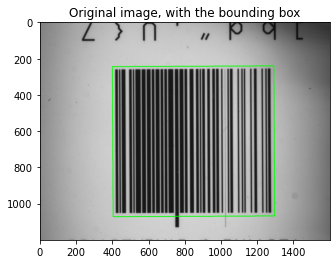

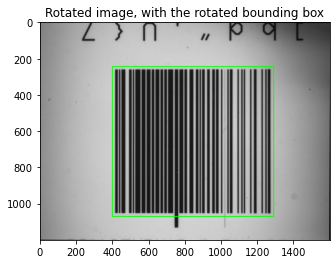

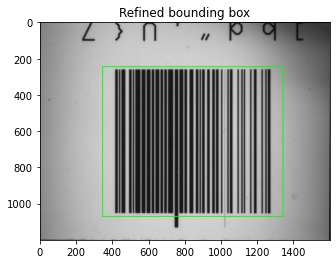

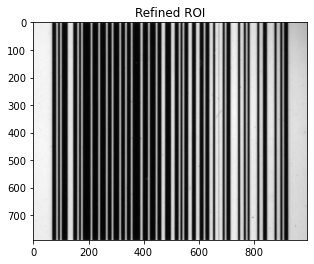

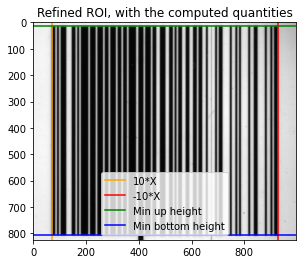

In [279]:
%%time
t = refine_roi(f'../images/{images_paths[0]}')
times.append(t)

Time for detecting the ROI: 0.11391782760620117
Time for rotating the image and the ROI: 0.039708614349365234
Time forfixing the horixontal barcode: 0.0039997100830078125
Time for computing the ROI quantities: 0.14320945739746094
Time for refining the ROI: 0.05269479751586914
Overall time: 0.3495306968688965
Wall time: 350 ms


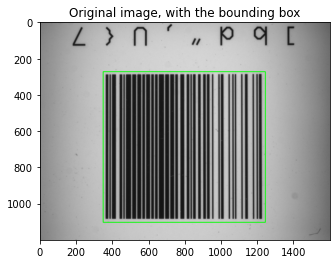

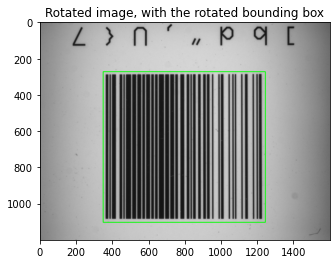

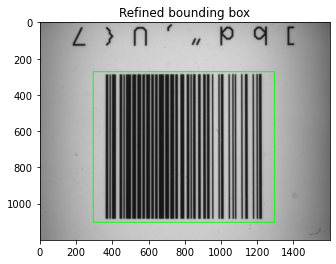

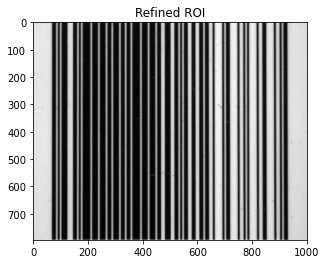

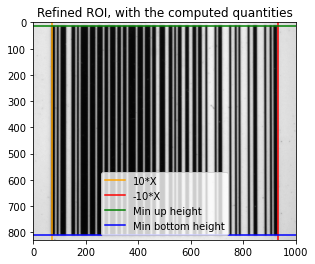

In [280]:
%%time
t = refine_roi(f'../images/{images_paths[1]}')
times.append(t)

Time for detecting the ROI: 0.0539553165435791
Time for rotating the image and the ROI: 0.03318071365356445
Time forfixing the horixontal barcode: 0.0019986629486083984
Time for computing the ROI quantities: 0.0807802677154541
Time for refining the ROI: 0.04686999320983887
Overall time: 0.21478629112243652
Wall time: 215 ms


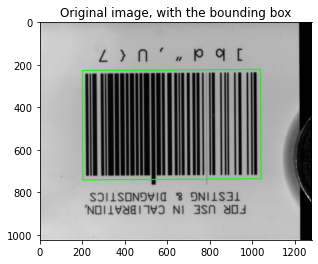

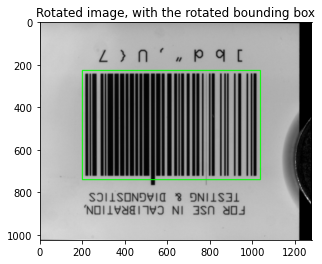

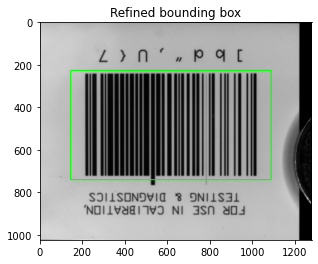

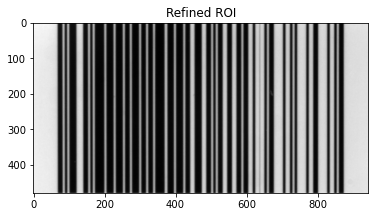

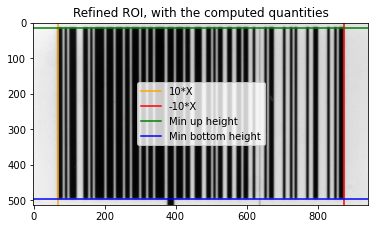

In [281]:
%%time
t = refine_roi(f'../images/{images_paths[2]}')
times.append(t)

Time for detecting the ROI: 0.054219722747802734
Time for rotating the image and the ROI: 0.0137786865234375
Time forfixing the horixontal barcode: 0.01566004753112793
Time for computing the ROI quantities: 0.10397529602050781
Time for refining the ROI: 0.05515789985656738
Overall time: 0.22713160514831543
Wall time: 228 ms


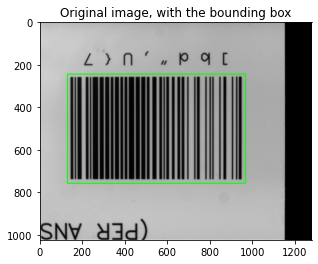

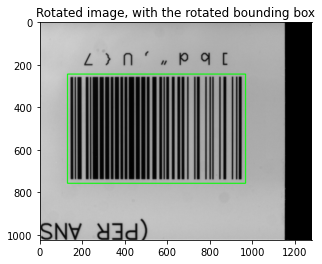

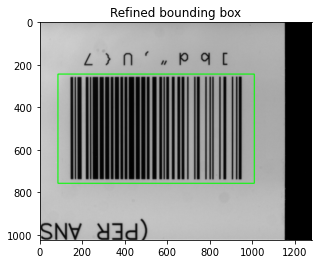

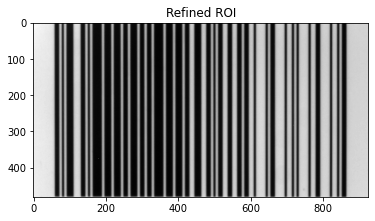

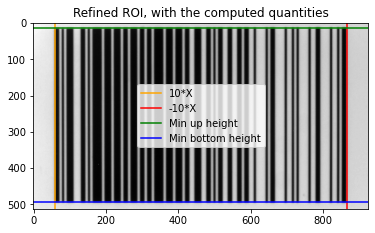

In [282]:
%%time
t = refine_roi(f'../images/{images_paths[3]}')
times.append(t)

Time for detecting the ROI: 0.057564496994018555
Time for rotating the image and the ROI: 0.03187751770019531
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.1102147102355957
Time for refining the ROI: 0.055947065353393555
Overall time: 0.2556037902832031
Wall time: 256 ms


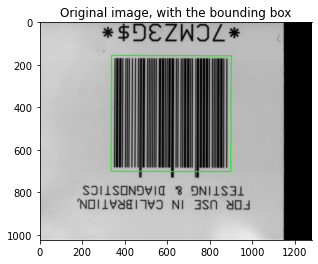

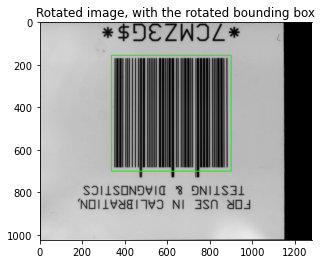

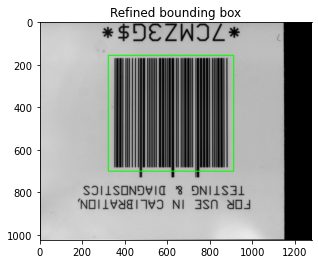

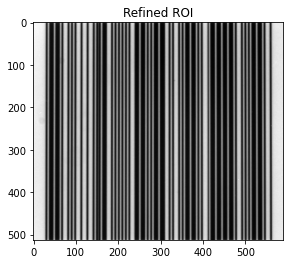

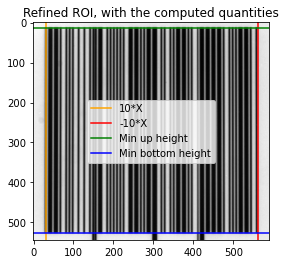

In [283]:
%%time
t = refine_roi(f'../images/{images_paths[4]}')
times.append(t)

Time for detecting the ROI: 0.0524904727935791
Time for rotating the image and the ROI: 0.017799854278564453
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.10934853553771973
Time for refining the ROI: 0.04713702201843262
Overall time: 0.2267758846282959
Wall time: 227 ms


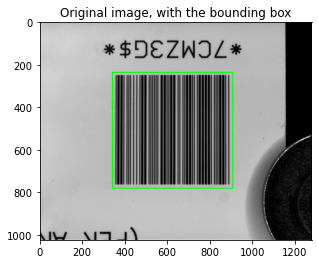

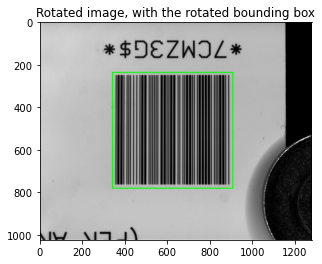

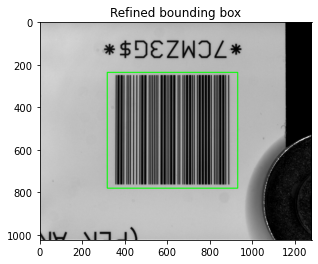

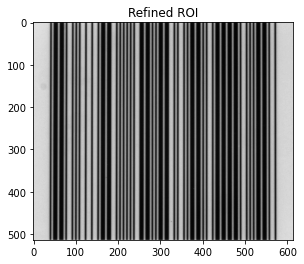

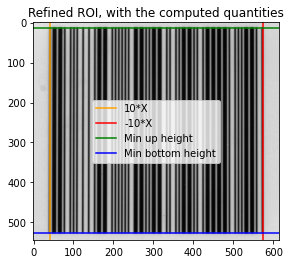

In [284]:
%%time
t = refine_roi(f'../images/{images_paths[5]}')
times.append(t)

Time for detecting the ROI: 0.0525355339050293
Time for rotating the image and the ROI: 0.01762104034423828
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.12344956398010254
Time for refining the ROI: 0.0475621223449707
Overall time: 0.24116826057434082
Wall time: 241 ms


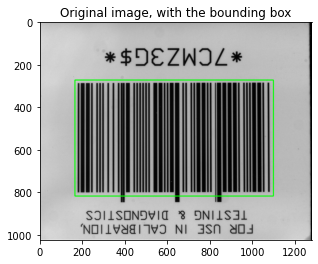

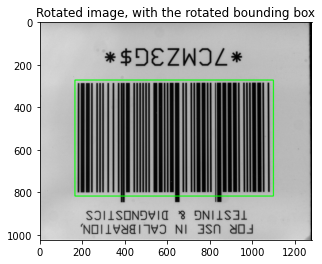

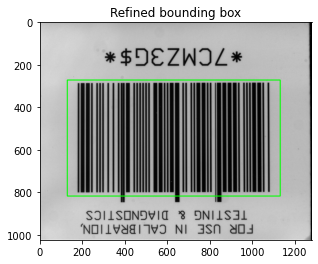

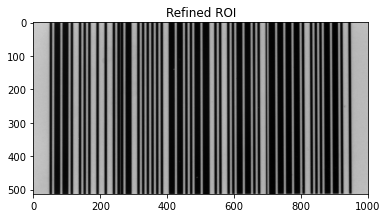

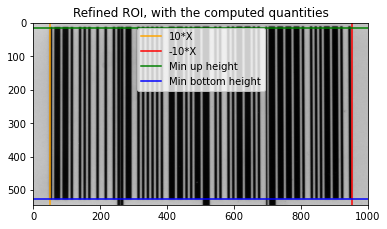

In [285]:
%%time
t = refine_roi(f'../images/{images_paths[6]}')
times.append(t)

Time for detecting the ROI: 0.05419278144836426
Time for rotating the image and the ROI: 0.013676643371582031
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.12598204612731934
Time for refining the ROI: 0.04701399803161621
Overall time: 0.24086546897888184
Wall time: 241 ms


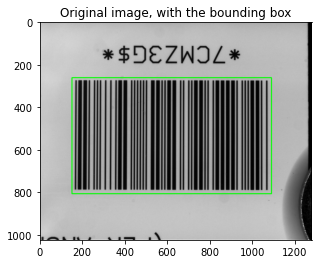

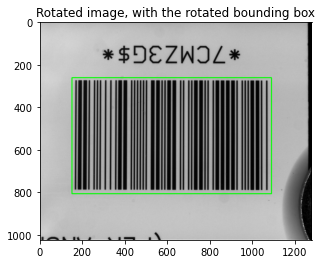

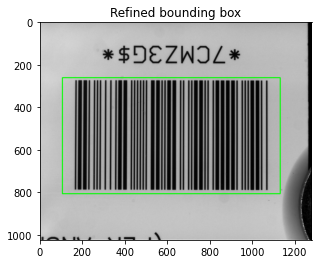

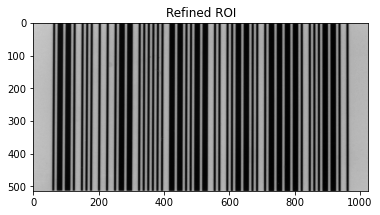

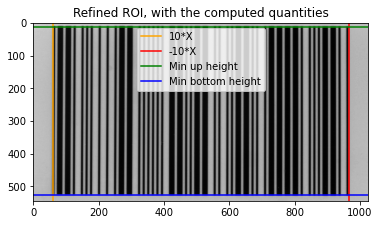

In [286]:
%%time
t = refine_roi(f'../images/{images_paths[7]}')
times.append(t)

Time for detecting the ROI: 0.05382251739501953
Time for rotating the image and the ROI: 0.017065763473510742
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.0625615119934082
Time for refining the ROI: 0.0781245231628418
Overall time: 0.21157431602478027
Wall time: 212 ms


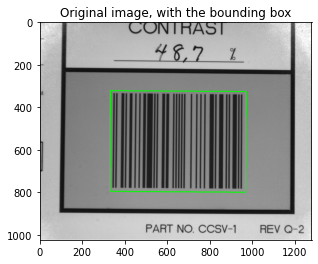

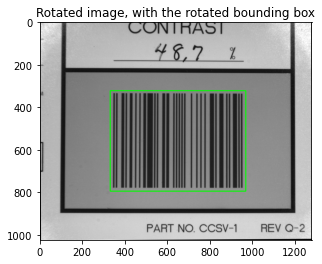

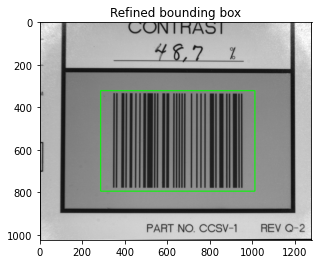

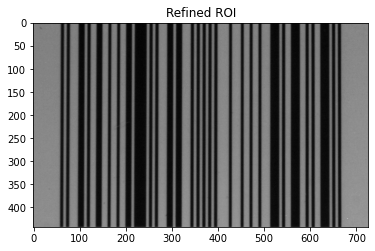

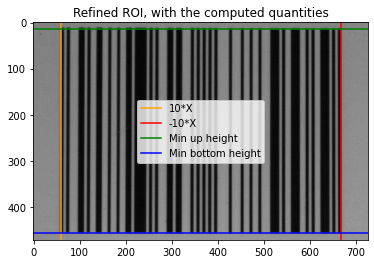

In [287]:
%%time
t = refine_roi(f'../images/{images_paths[8]}')
times.append(t)

Time for detecting the ROI: 0.053540706634521484
Time for rotating the image and the ROI: 0.016344308853149414
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06833195686340332
Time for refining the ROI: 0.046799659729003906
Overall time: 0.18501663208007812
Wall time: 185 ms


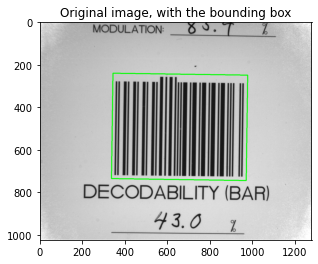

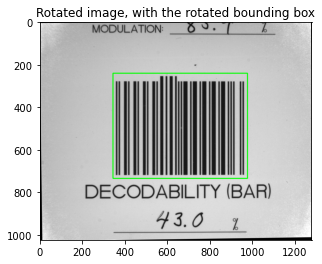

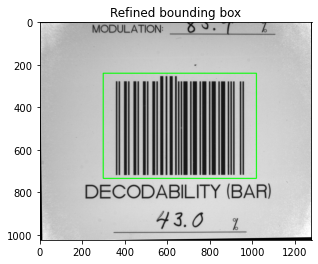

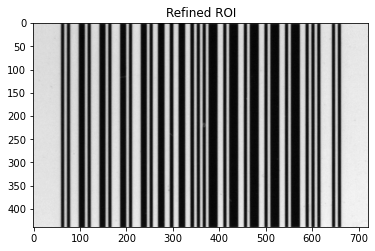

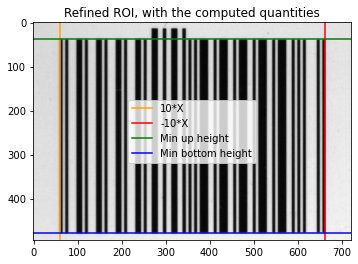

In [288]:
%%time
t = refine_roi(f'../images/{images_paths[9]}')
times.append(t)

Time for detecting the ROI: 0.04437565803527832
Time for rotating the image and the ROI: 0.029130935668945312
Time forfixing the horixontal barcode: 0.007814645767211914
Time for computing the ROI quantities: 0.06191420555114746
Time for refining the ROI: 0.053072452545166016
Overall time: 0.1884932518005371
Wall time: 189 ms


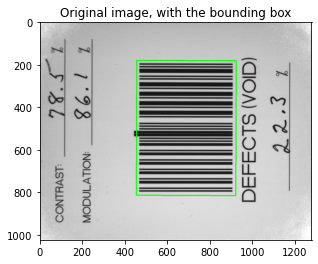

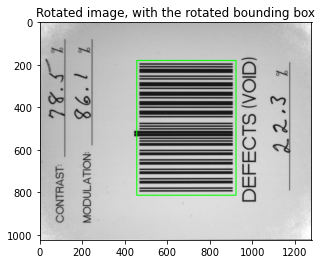

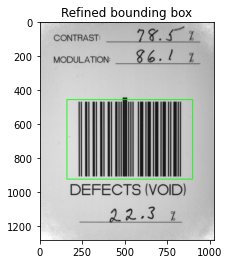

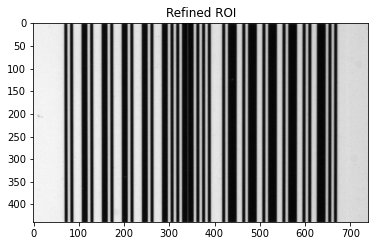

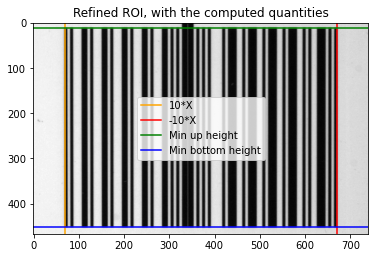

In [337]:
%%time
t = refine_roi(f'../images/{images_paths[10]}')
times.append(t)

Time for detecting the ROI: 0.05194234848022461
Time for rotating the image and the ROI: 0.018123626708984375
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.07659745216369629
Time for refining the ROI: 0.0473172664642334
Overall time: 0.19398069381713867
Wall time: 194 ms


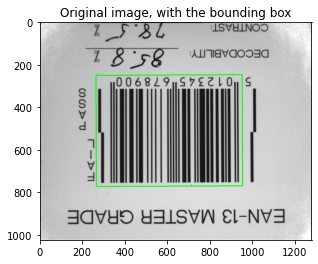

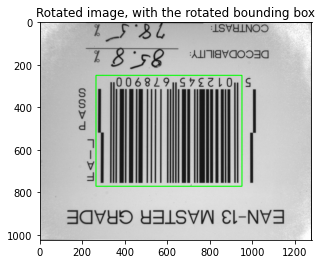

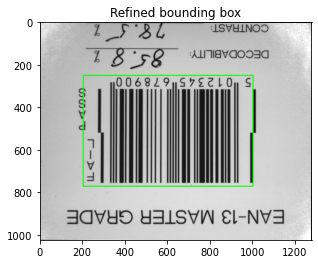

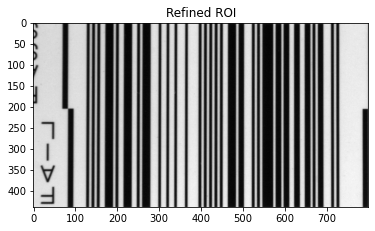

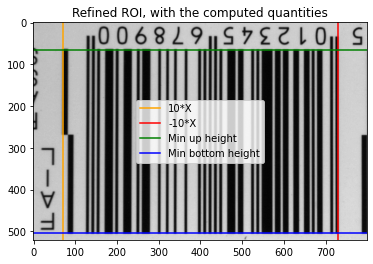

In [290]:
%%time
t = refine_roi(f'../images/{images_paths[11]}')
times.append(t)

Time for detecting the ROI: 0.042534589767456055
Time for rotating the image and the ROI: 0.025661468505859375
Time forfixing the horixontal barcode: 0.0076580047607421875
Time for computing the ROI quantities: 0.05837249755859375
Time for refining the ROI: 0.061014413833618164
Overall time: 0.18758296966552734
Wall time: 189 ms


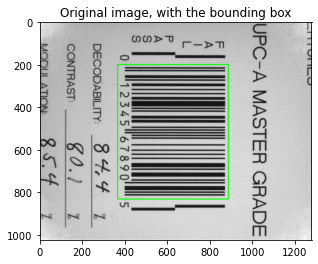

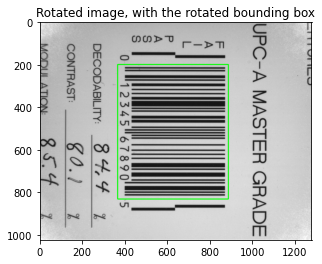

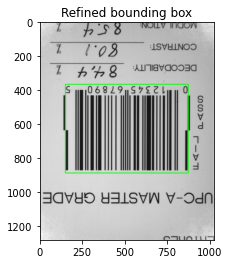

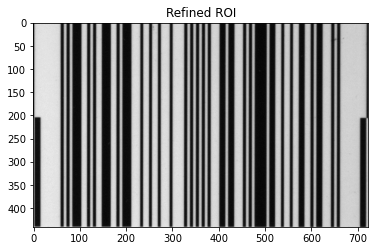

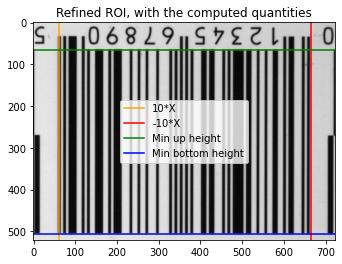

In [338]:
%%time
t = refine_roi(f'../images/{images_paths[12]}')
times.append(t)

Time for detecting the ROI: 0.03765416145324707
Time for rotating the image and the ROI: 0.01016545295715332
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.04695415496826172
Time for refining the ROI: 0.04685783386230469
Overall time: 0.1416316032409668
Wall time: 142 ms


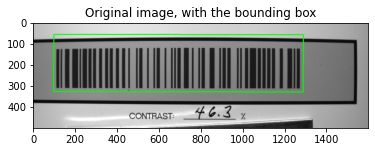

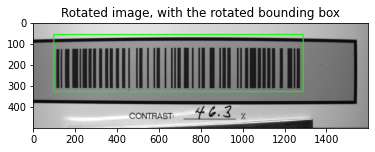

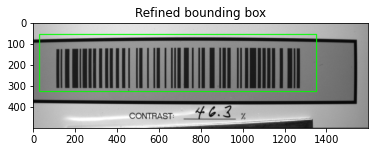

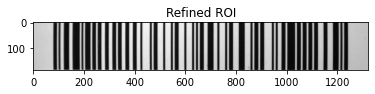

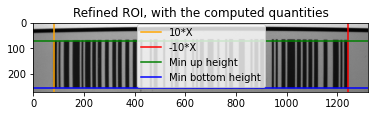

In [292]:
%%time
t = refine_roi(f'../images/{images_paths[13]}')
times.append(t)

Time for detecting the ROI: 0.03752279281616211
Time for rotating the image and the ROI: 0.012941837310791016
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.03130698204040527
Time for refining the ROI: 0.04686903953552246
Overall time: 0.12864065170288086
Wall time: 129 ms


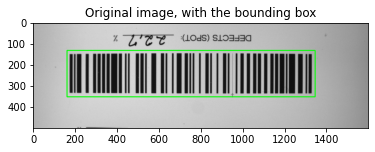

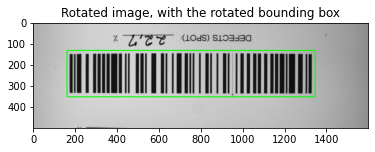

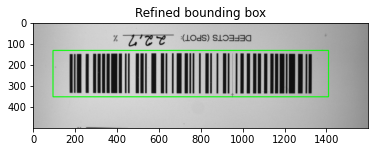

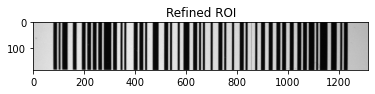

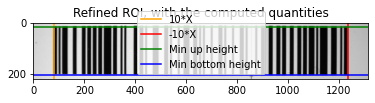

In [293]:
%%time
t = refine_roi(f'../images/{images_paths[14]}')
times.append(t)

Time for detecting the ROI: 0.03848409652709961
Time for rotating the image and the ROI: 0.02190685272216797
Time forfixing the horixontal barcode: 0.001001596450805664
Time for computing the ROI quantities: 0.038445234298706055
Time for refining the ROI: 0.042151451110839844
Overall time: 0.14098763465881348
Wall time: 141 ms


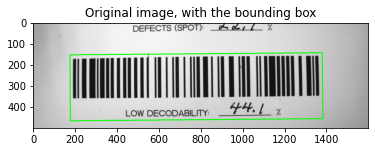

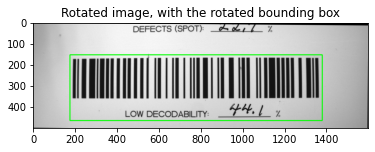

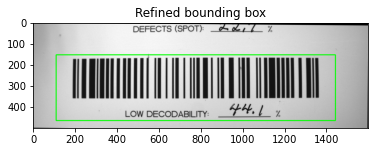

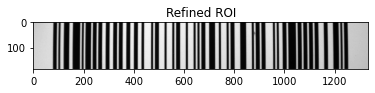

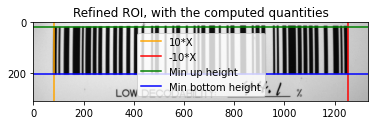

In [294]:
%%time
t = refine_roi(f'../images/{images_paths[15]}')
times.append(t)

Time for detecting the ROI: 0.03785276412963867
Time for rotating the image and the ROI: 0.01613140106201172
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.03131604194641113
Time for refining the ROI: 0.0468754768371582
Overall time: 0.13217568397521973
Wall time: 132 ms


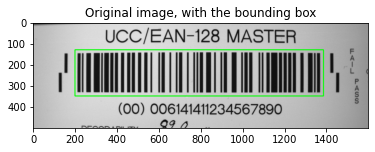

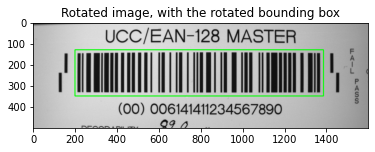

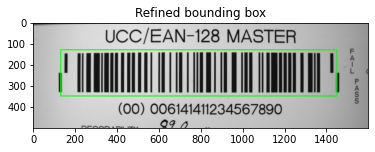

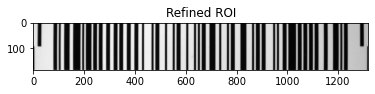

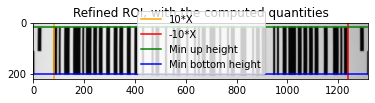

In [295]:
%%time
t = refine_roi(f'../images/{images_paths[16]}')
times.append(t)

Time for detecting the ROI: 0.03888678550720215
Time for rotating the image and the ROI: 0.021000385284423828
Time forfixing the horixontal barcode: 0.001001119613647461
Time for computing the ROI quantities: 0.03779458999633789
Time for refining the ROI: 0.046875953674316406
Overall time: 0.14455771446228027
Wall time: 145 ms


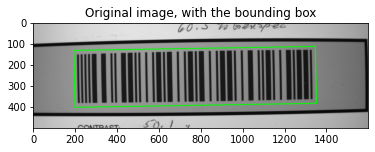

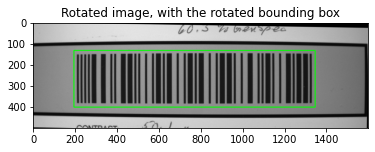

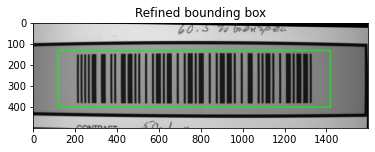

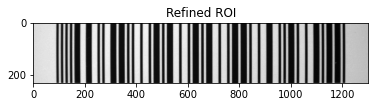

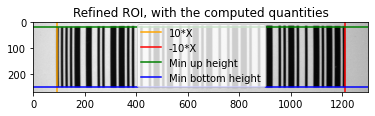

In [296]:
%%time
t = refine_roi(f'../images/{images_paths[17]}')
times.append(t)

In [297]:
f'../images/{images_paths[18]}'

'../images/I25-DEFECTS IMGB.BMP'

Time for detecting the ROI: 0.03644609451293945
Time for rotating the image and the ROI: 0.01687312126159668
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.04687094688415527
Time for refining the ROI: 0.031249046325683594
Overall time: 0.131439208984375
Wall time: 131 ms


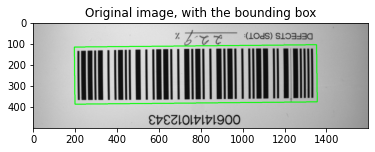

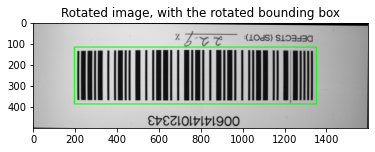

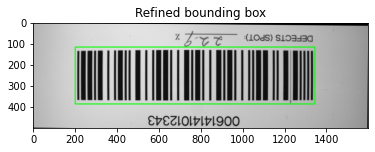

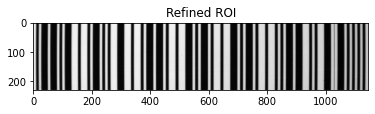

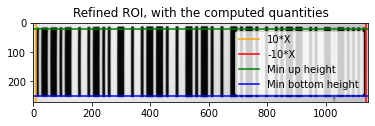

In [298]:
%%time
t = refine_roi(f'../images/{images_paths[18]}')
times.append(t)

Time for detecting the ROI: 0.04096031188964844
Time for rotating the image and the ROI: 0.01999950408935547
Time forfixing the horixontal barcode: 0.002000570297241211
Time for computing the ROI quantities: 0.05452299118041992
Time for refining the ROI: 0.06249570846557617
Overall time: 0.177978515625
Wall time: 178 ms


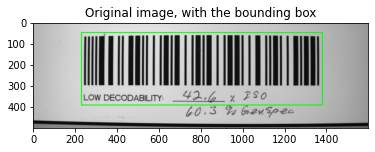

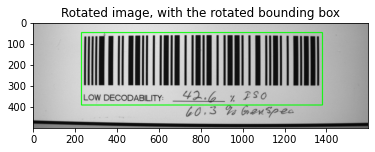

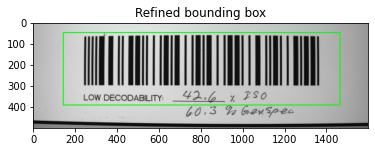

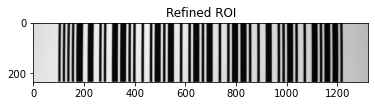

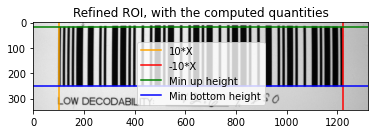

In [299]:
%%time
t = refine_roi(f'../images/{images_paths[19]}')
times.append(t)

Time for detecting the ROI: 0.03731727600097656
Time for rotating the image and the ROI: 0.01700115203857422
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.04724574089050293
Time for refining the ROI: 0.031236648559570312
Overall time: 0.13280081748962402
Wall time: 133 ms


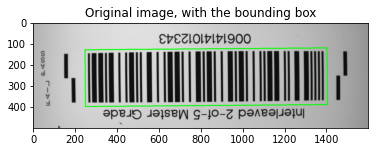

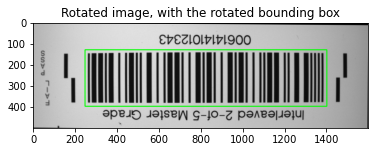

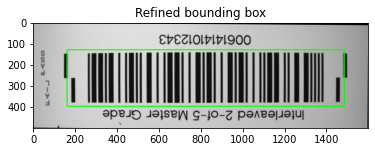

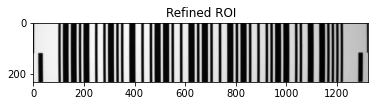

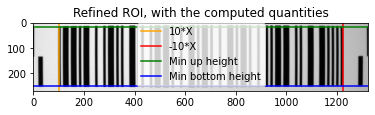

In [300]:
%%time
t = refine_roi(f'../images/{images_paths[20]}')
times.append(t)

Time for detecting the ROI: 0.05450916290283203
Time for rotating the image and the ROI: 0.028012514114379883
Time forfixing the horixontal barcode: 0.0009105205535888672
Time for computing the ROI quantities: 0.04997563362121582
Time for refining the ROI: 0.056915283203125
Overall time: 0.18941259384155273
Wall time: 189 ms


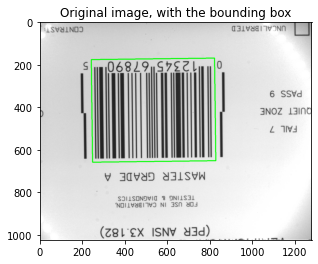

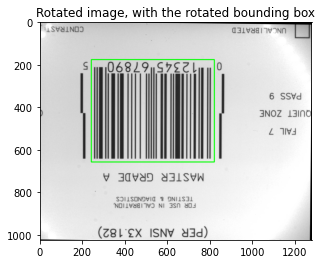

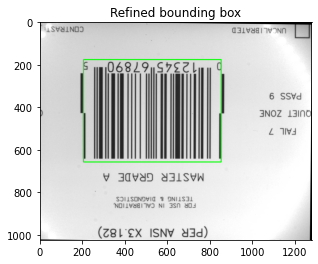

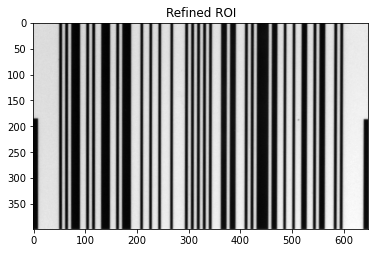

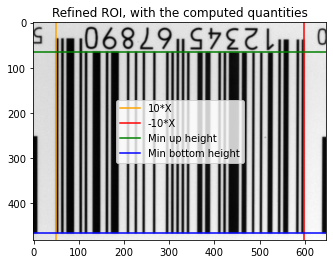

In [301]:
%%time
t = refine_roi(f'../images/{images_paths[22]}')
times.append(t)

Time for detecting the ROI: 0.05372786521911621
Time for rotating the image and the ROI: 0.028090953826904297
Time forfixing the horixontal barcode: 0.001986265182495117
Time for computing the ROI quantities: 0.05181312561035156
Time for refining the ROI: 0.04687190055847168
Overall time: 0.18050384521484375
Wall time: 181 ms


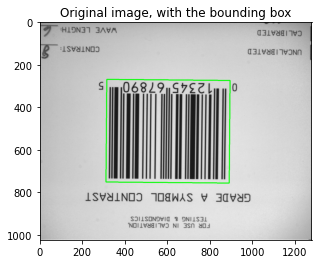

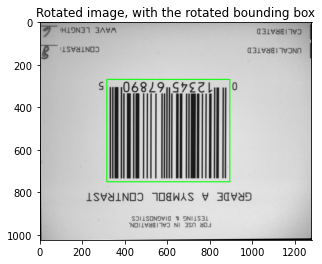

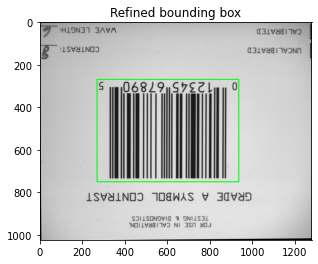

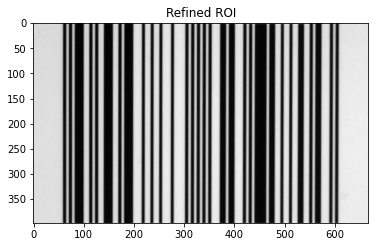

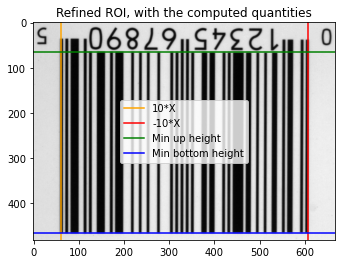

In [302]:
%%time
t = refine_roi(f'../images/{images_paths[23]}')
times.append(t)

Time for detecting the ROI: 0.08690977096557617
Time for rotating the image and the ROI: 0.015667200088500977
Time forfixing the horixontal barcode: 0.01569676399230957
Time for computing the ROI quantities: 0.06256794929504395
Time for refining the ROI: 0.046863555908203125
Overall time: 0.21200847625732422
Wall time: 228 ms


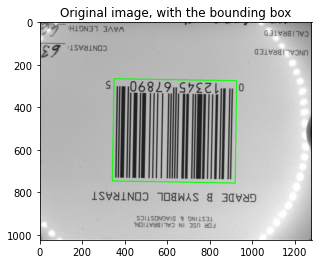

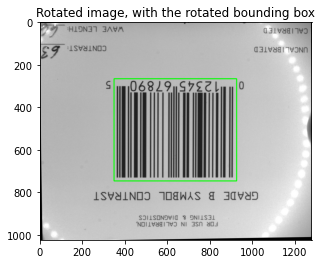

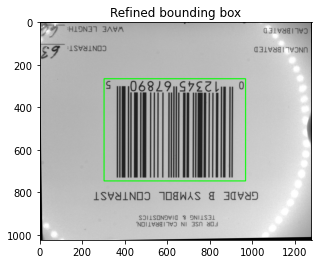

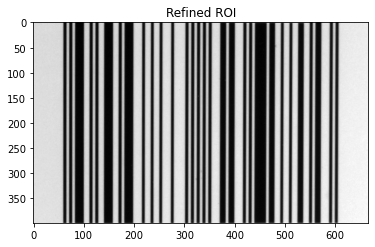

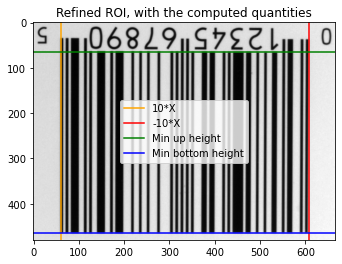

In [303]:
%%time
t = refine_roi(f'../images/{images_paths[24]}')
times.append(t)

Time for detecting the ROI: 0.054520368576049805
Time for rotating the image and the ROI: 0.025893449783325195
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.062493085861206055
Time for refining the ROI: 0.04687380790710449
Overall time: 0.18978071212768555
Wall time: 190 ms


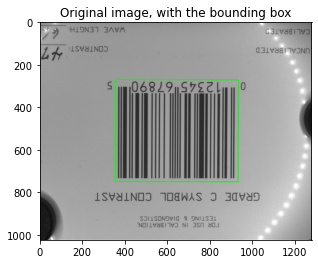

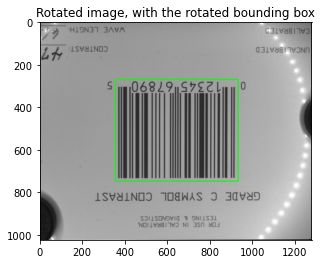

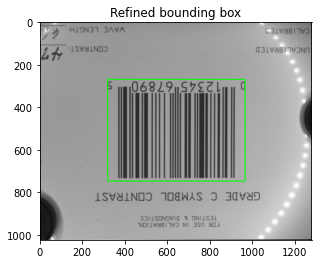

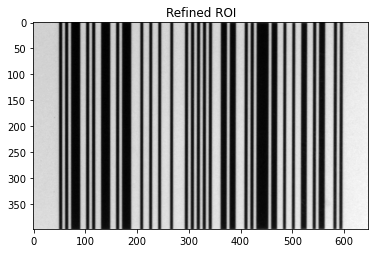

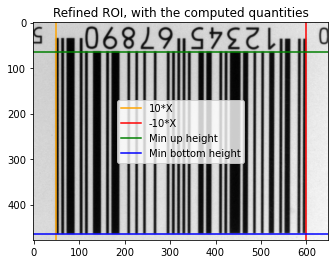

In [304]:
%%time
t = refine_roi(f'../images/{images_paths[25]}')
times.append(t)

Time for detecting the ROI: 0.05066657066345215
Time for rotating the image and the ROI: 0.018947601318359375
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06257343292236328
Time for refining the ROI: 0.0468602180480957
Overall time: 0.1790478229522705
Wall time: 179 ms


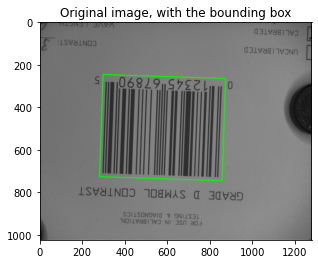

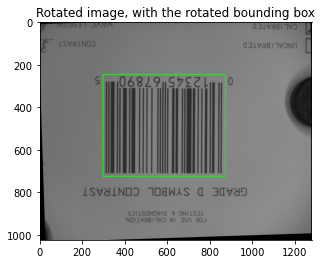

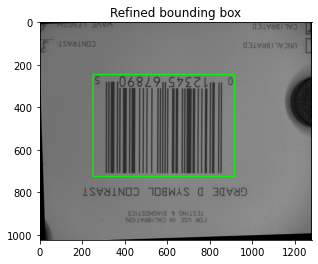

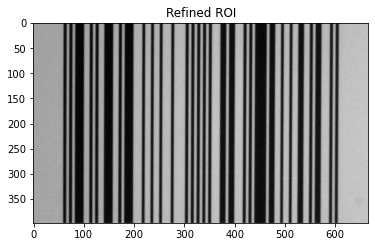

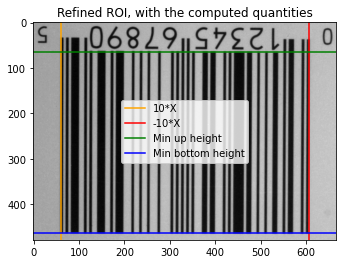

In [305]:
%%time
t = refine_roi(f'../images/{images_paths[26]}')
times.append(t)

Time for detecting the ROI: 0.049834489822387695
Time for rotating the image and the ROI: 0.02214503288269043
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.07021236419677734
Time for refining the ROI: 0.04686999320983887
Overall time: 0.18906188011169434
Wall time: 189 ms


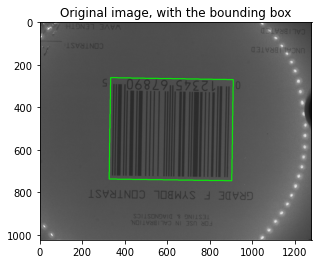

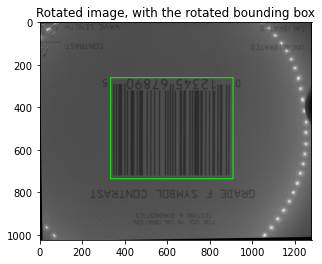

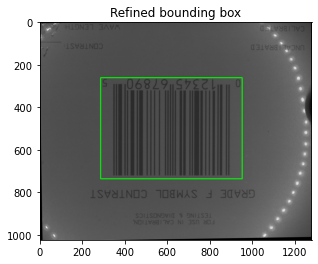

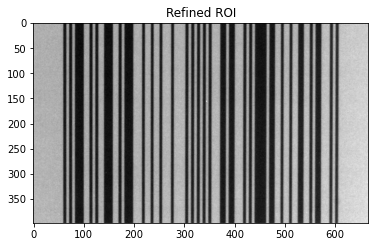

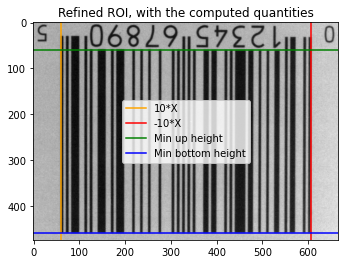

In [306]:
%%time
t = refine_roi(f'../images/{images_paths[27]}')
times.append(t)

Time for detecting the ROI: 0.04984593391418457
Time for rotating the image and the ROI: 0.019742965698242188
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.0694131851196289
Time for refining the ROI: 0.04688143730163574
Overall time: 0.1858835220336914
Wall time: 186 ms


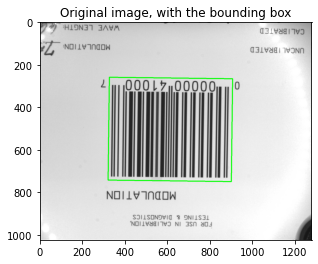

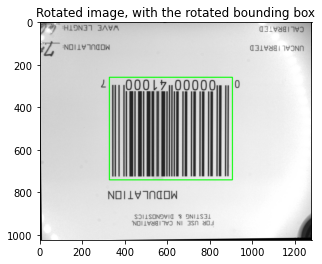

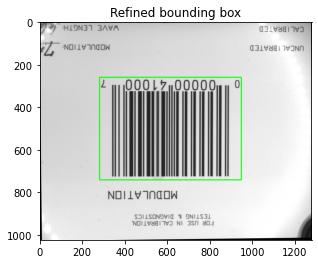

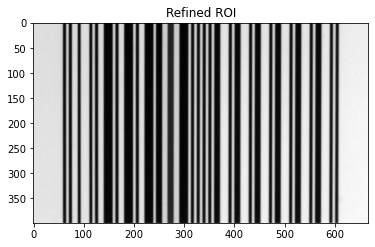

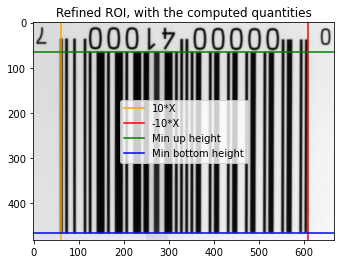

In [307]:
%%time
t = refine_roi(f'../images/{images_paths[28]}')
times.append(t)

Time for detecting the ROI: 0.05471158027648926
Time for rotating the image and the ROI: 0.02925562858581543
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06256914138793945
Time for refining the ROI: 0.04687905311584473
Overall time: 0.19341540336608887
Wall time: 193 ms


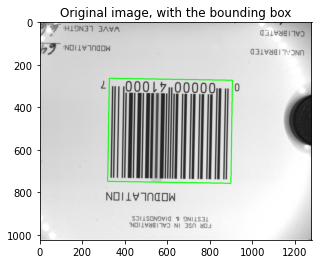

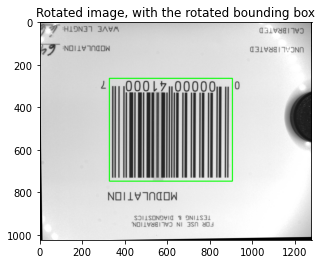

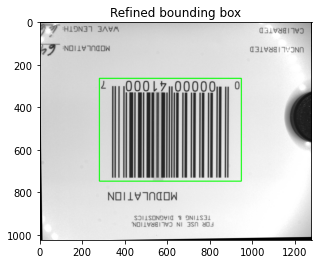

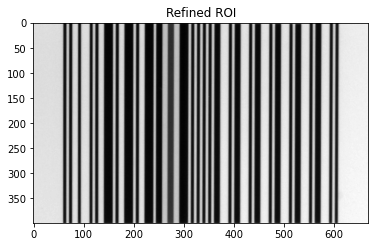

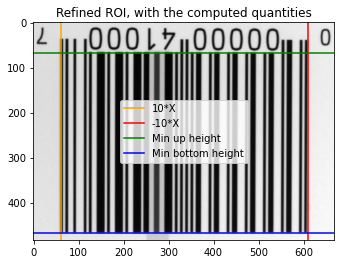

In [308]:
%%time
t = refine_roi(f'../images/{images_paths[29]}')
times.append(t)

Time for detecting the ROI: 0.052048683166503906
Time for rotating the image and the ROI: 0.015934467315673828
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06257104873657227
Time for refining the ROI: 0.04686737060546875
Overall time: 0.19304895401000977
Wall time: 194 ms


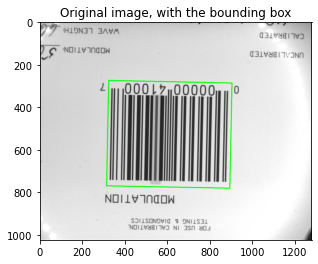

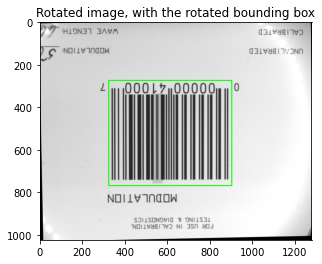

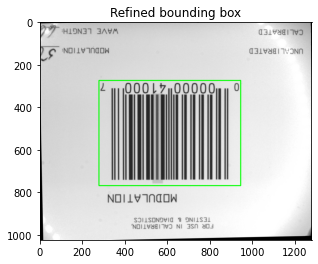

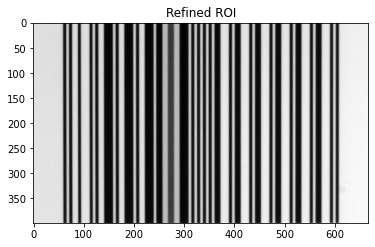

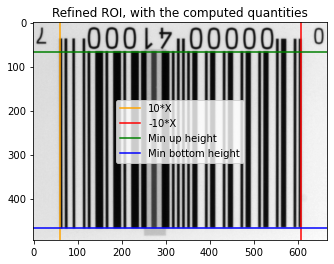

In [309]:
%%time
t = refine_roi(f'../images/{images_paths[30]}')
times.append(t)

Time for detecting the ROI: 0.052733421325683594
Time for rotating the image and the ROI: 0.028075456619262695
Time forfixing the horixontal barcode: 0.0010445117950439453
Time for computing the ROI quantities: 0.05480170249938965
Time for refining the ROI: 0.07811713218688965
Overall time: 0.21372771263122559
Wall time: 214 ms


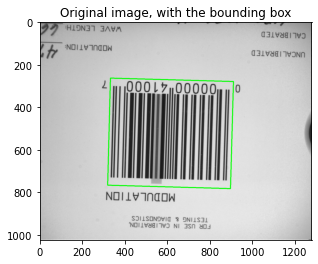

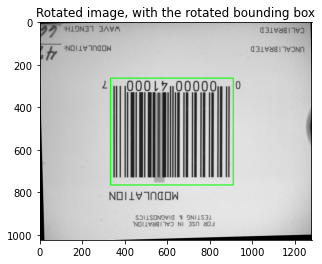

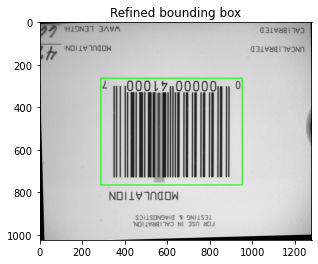

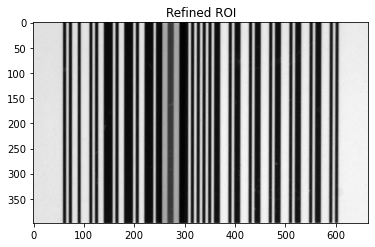

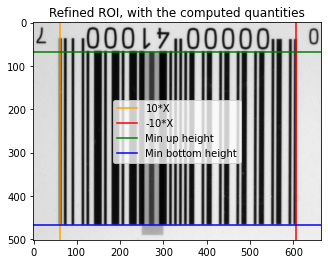

In [310]:
%%time
t = refine_roi(f'../images/{images_paths[31]}')
times.append(t)

Time for detecting the ROI: 0.05329728126525879
Time for rotating the image and the ROI: 0.028078079223632812
Time forfixing the horixontal barcode: 0.0009610652923583984
Time for computing the ROI quantities: 0.058202505111694336
Time for refining the ROI: 0.049294471740722656
Overall time: 0.1888723373413086
Wall time: 189 ms


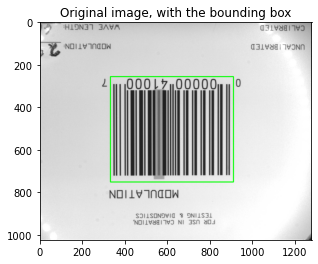

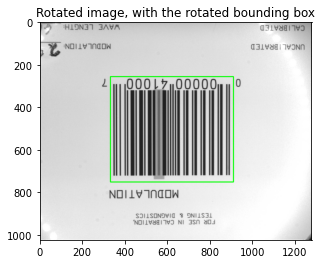

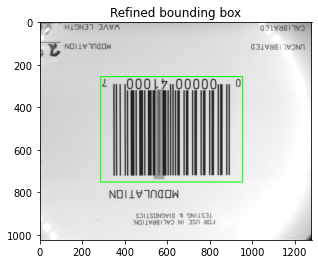

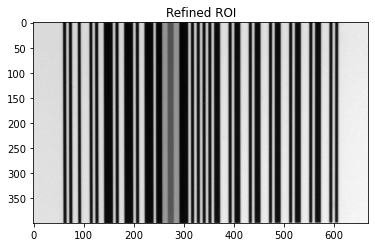

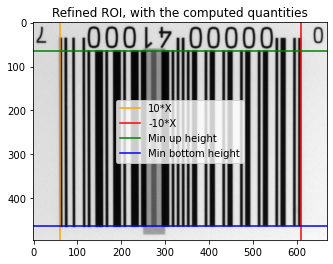

In [311]:
%%time
t = refine_roi(f'../images/{images_paths[32]}')
times.append(t)

Time for detecting the ROI: 0.05995583534240723
Time for rotating the image and the ROI: 0.025565624237060547
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06279826164245605
Time for refining the ROI: 0.04686760902404785
Overall time: 0.19518733024597168
Wall time: 195 ms


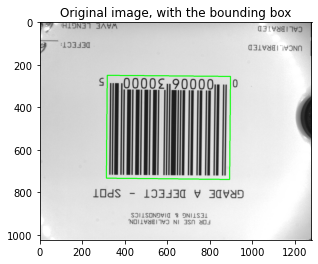

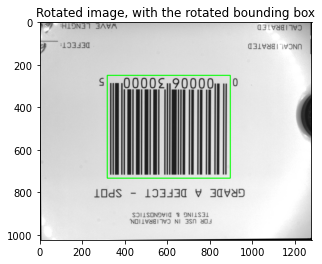

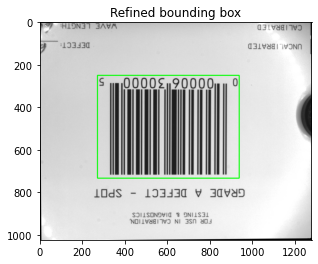

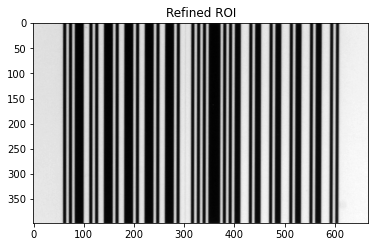

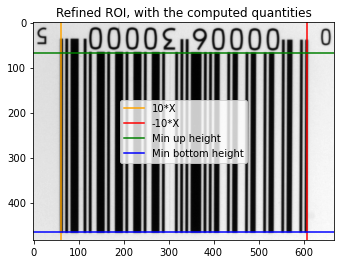

In [312]:
%%time
t = refine_roi(f'../images/{images_paths[33]}')
times.append(t)

Time for detecting the ROI: 0.050954580307006836
Time for rotating the image and the ROI: 0.019741296768188477
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06249260902404785
Time for refining the ROI: 0.047072410583496094
Overall time: 0.18026089668273926
Wall time: 180 ms


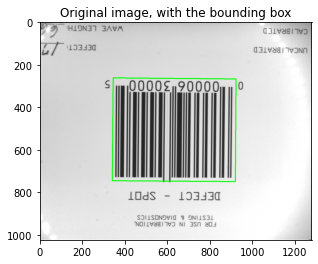

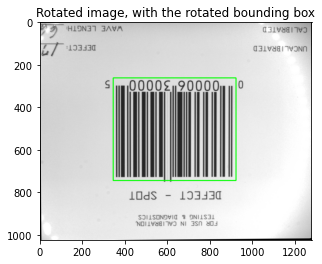

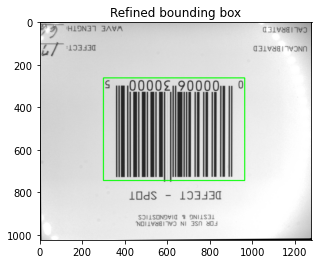

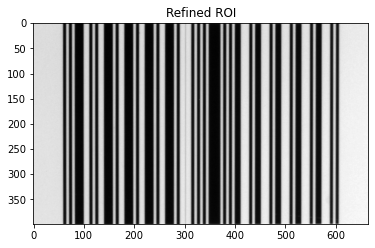

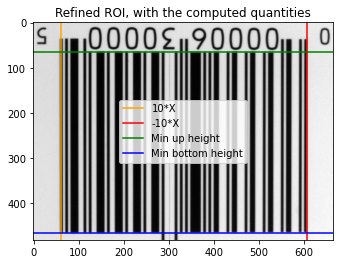

In [313]:
%%time
t = refine_roi(f'../images/{images_paths[34]}')
times.append(t)

Time for detecting the ROI: 0.07581543922424316
Time for rotating the image and the ROI: 0.02454853057861328
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.07262945175170898
Time for refining the ROI: 0.04695606231689453
Overall time: 0.21994948387145996
Wall time: 220 ms


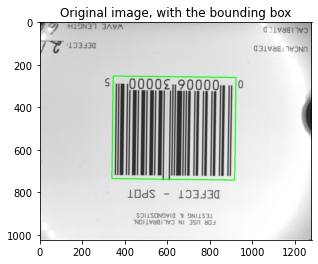

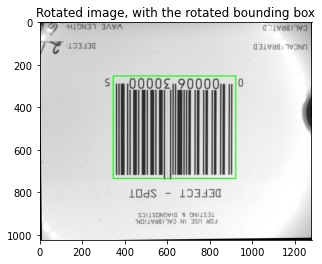

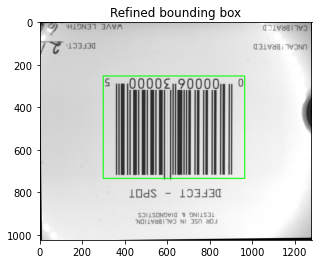

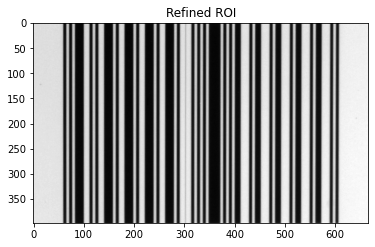

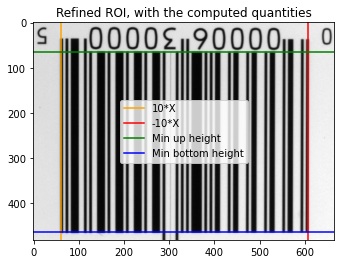

In [314]:
%%time
t = refine_roi(f'../images/{images_paths[35]}')
times.append(t)

Time for detecting the ROI: 0.07296133041381836
Time for rotating the image and the ROI: 0.03319859504699707
Time forfixing the horixontal barcode: 0.002301454544067383
Time for computing the ROI quantities: 0.07481861114501953
Time for refining the ROI: 0.05539274215698242
Overall time: 0.23637127876281738
Wall time: 236 ms


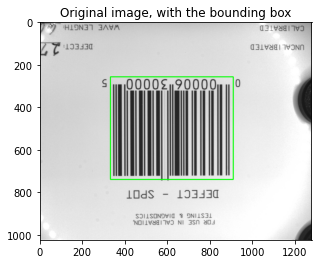

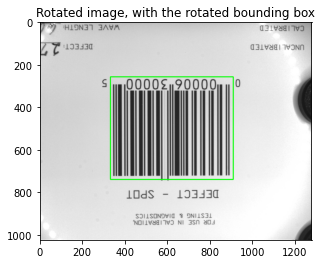

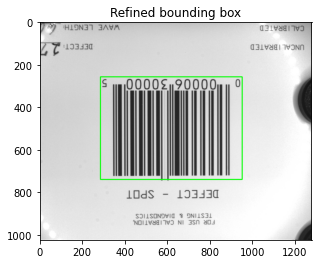

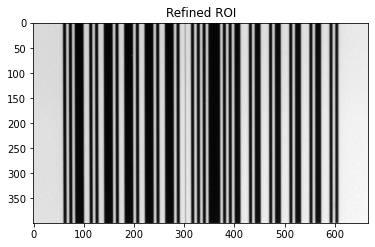

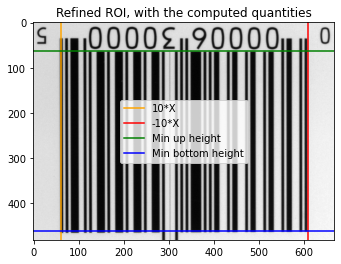

In [315]:
%%time
t = refine_roi(f'../images/{images_paths[36]}')
times.append(t)

Time for detecting the ROI: 0.06028103828430176
Time for rotating the image and the ROI: 0.02802133560180664
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.062494516372680664
Time for refining the ROI: 0.0627889633178711
Overall time: 0.21358585357666016
Wall time: 214 ms


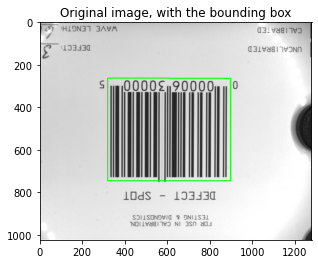

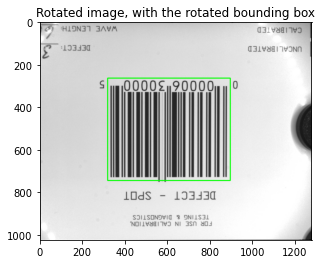

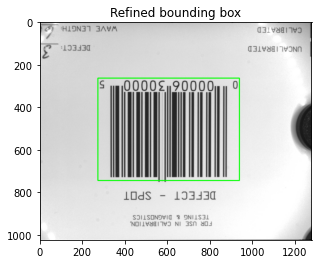

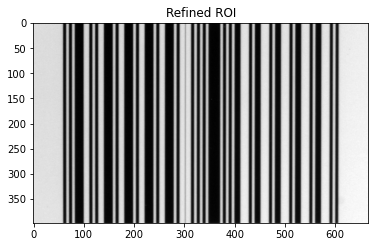

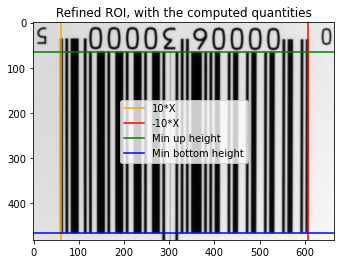

In [316]:
%%time
t = refine_roi(f'../images/{images_paths[37]}')
times.append(t)

Time for detecting the ROI: 0.06115913391113281
Time for rotating the image and the ROI: 0.023227214813232422
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06414151191711426
Time for refining the ROI: 0.046871185302734375
Overall time: 0.19539904594421387
Wall time: 195 ms


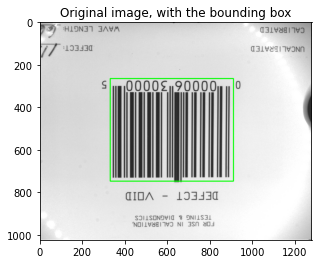

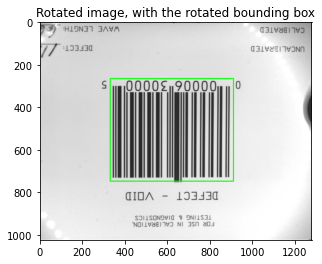

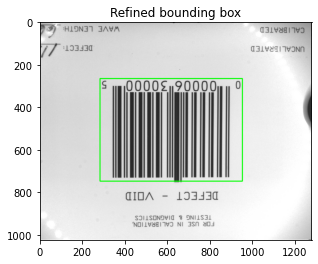

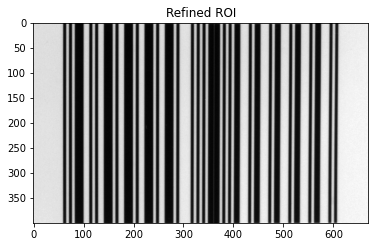

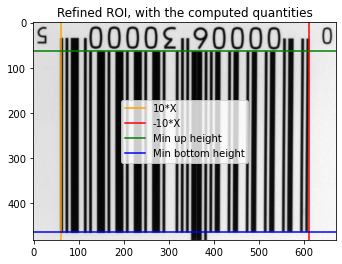

In [317]:
%%time
t = refine_roi(f'../images/{images_paths[38]}')
times.append(t)

Time for detecting the ROI: 0.050131797790527344
Time for rotating the image and the ROI: 0.02174544334411621
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06249499320983887
Time for refining the ROI: 0.046869516372680664
Overall time: 0.18124175071716309
Wall time: 181 ms


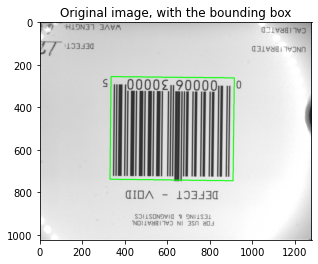

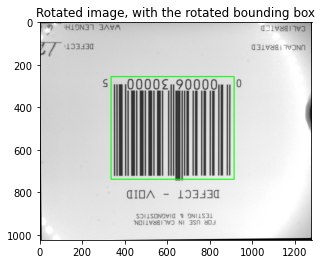

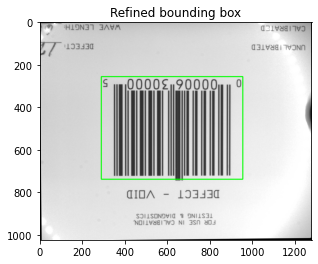

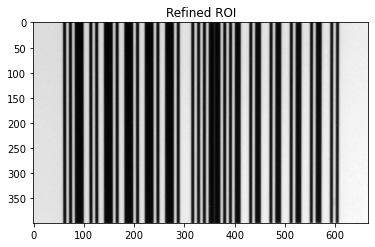

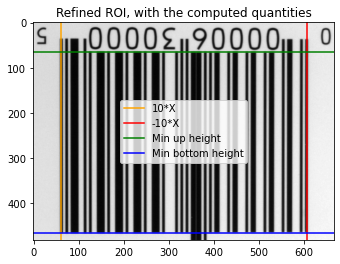

In [318]:
%%time
t = refine_roi(f'../images/{images_paths[39]}')
times.append(t)

Time for detecting the ROI: 0.04982566833496094
Time for rotating the image and the ROI: 0.019802331924438477
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06249380111694336
Time for refining the ROI: 0.04686617851257324
Overall time: 0.17898797988891602
Wall time: 195 ms


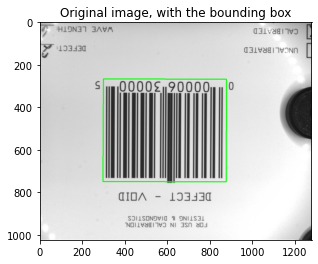

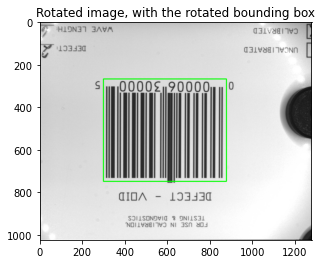

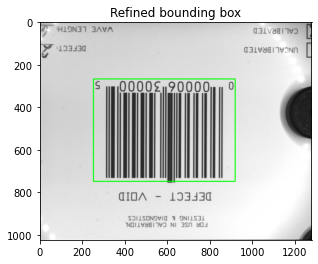

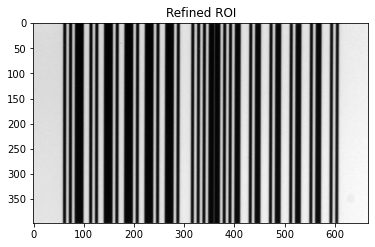

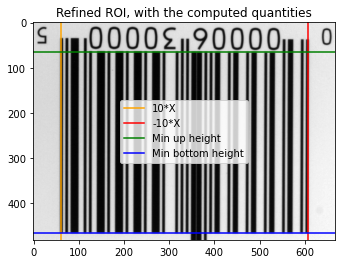

In [319]:
%%time
t = refine_roi(f'../images/{images_paths[40]}')
times.append(t)

Time for detecting the ROI: 0.05345869064331055
Time for rotating the image and the ROI: 0.028995037078857422
Time forfixing the horixontal barcode: 0.0009319782257080078
Time for computing the ROI quantities: 0.06464123725891113
Time for refining the ROI: 0.04716777801513672
Overall time: 0.19426274299621582
Wall time: 194 ms


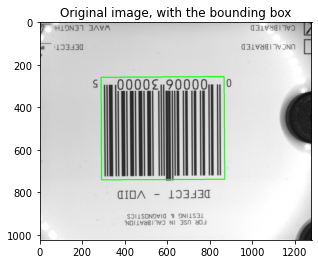

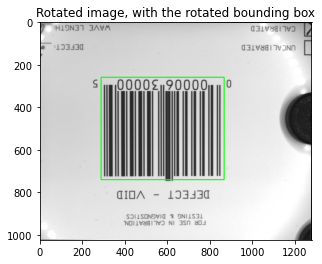

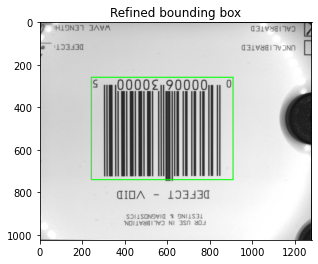

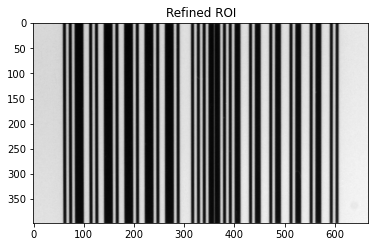

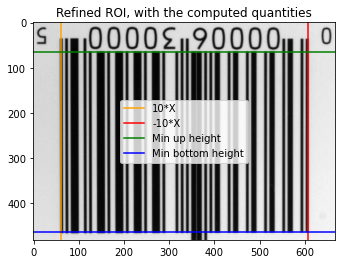

In [320]:
%%time
t = refine_roi(f'../images/{images_paths[41]}')
times.append(t)

Time for detecting the ROI: 0.05061984062194824
Time for rotating the image and the ROI: 0.02440190315246582
Time forfixing the horixontal barcode: 0.002001047134399414
Time for computing the ROI quantities: 0.05707597732543945
Time for refining the ROI: 0.07802724838256836
Overall time: 0.21012496948242188
Wall time: 210 ms


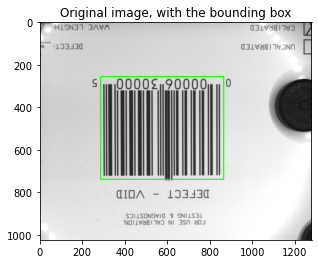

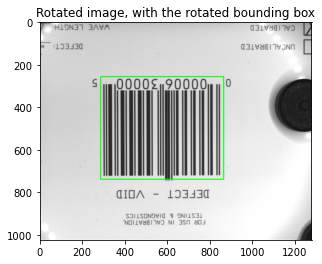

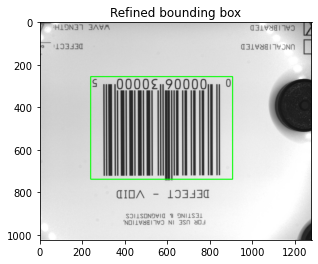

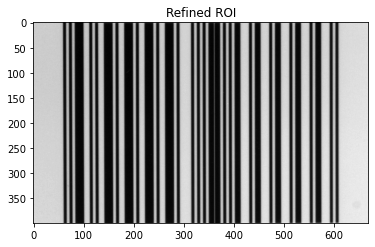

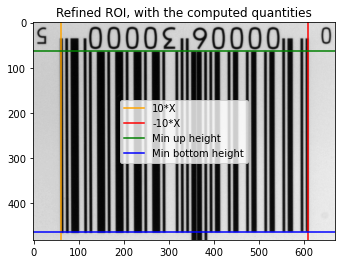

In [321]:
%%time
t = refine_roi(f'../images/{images_paths[42]}')
times.append(t)

Time for detecting the ROI: 0.04865217208862305
Time for rotating the image and the ROI: 0.020691394805908203
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06255793571472168
Time for refining the ROI: 0.04687070846557617
Overall time: 0.1787722110748291
Wall time: 179 ms


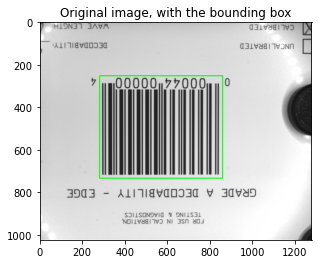

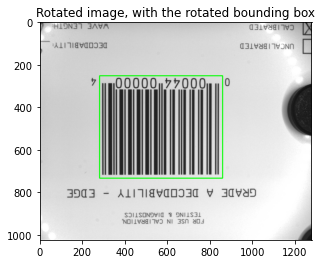

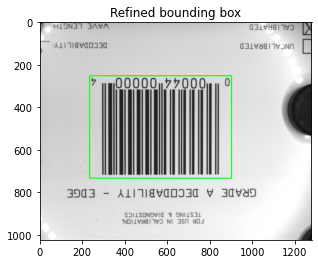

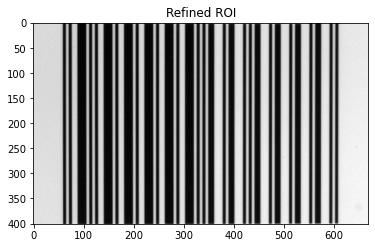

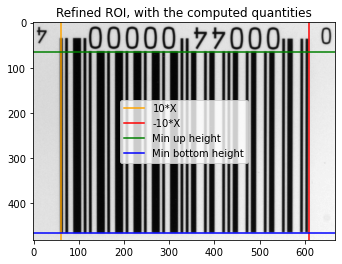

In [322]:
%%time
t = refine_roi(f'../images/{images_paths[43]}')
times.append(t)

Time for detecting the ROI: 0.05519461631774902
Time for rotating the image and the ROI: 0.02899956703186035
Time forfixing the horixontal barcode: 0.0009305477142333984
Time for computing the ROI quantities: 0.050045013427734375
Time for refining the ROI: 0.06248807907104492
Overall time: 0.19672727584838867
Wall time: 197 ms


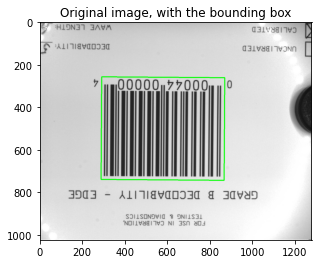

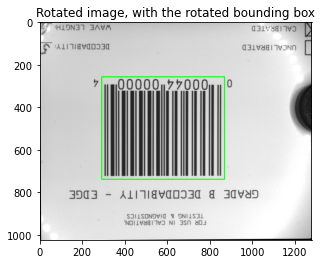

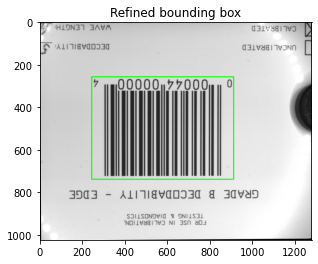

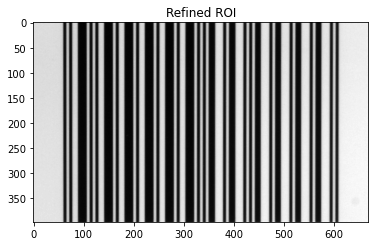

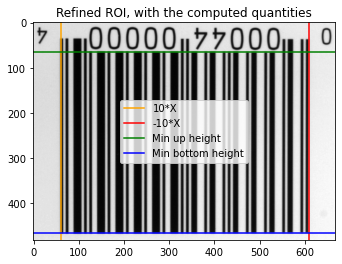

In [323]:
%%time
t = refine_roi(f'../images/{images_paths[44]}')
times.append(t)

Time for detecting the ROI: 0.050563812255859375
Time for rotating the image and the ROI: 0.0192413330078125
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.0625765323638916
Time for refining the ROI: 0.04686474800109863
Overall time: 0.1792464256286621
Wall time: 179 ms


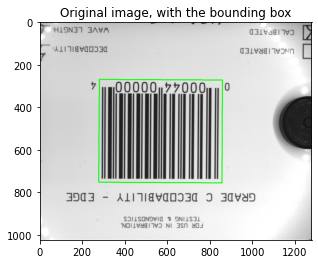

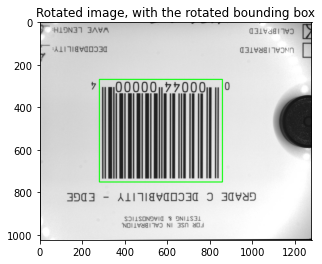

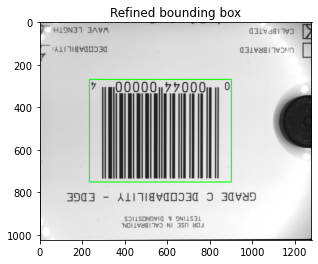

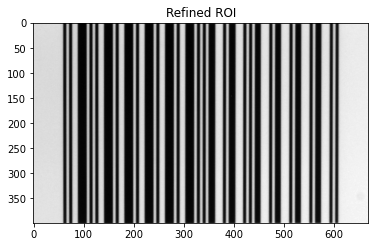

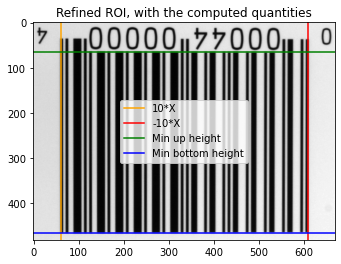

In [324]:
%%time
t = refine_roi(f'../images/{images_paths[45]}')
times.append(t)

Time for detecting the ROI: 0.07008910179138184
Time for rotating the image and the ROI: 0.031275033950805664
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.062493324279785156
Time for refining the ROI: 0.046878814697265625
Overall time: 0.21073627471923828
Wall time: 211 ms


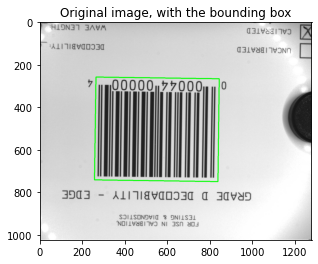

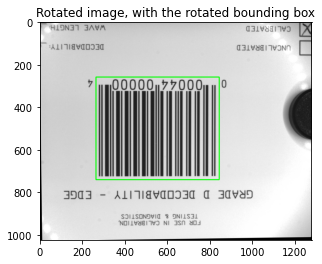

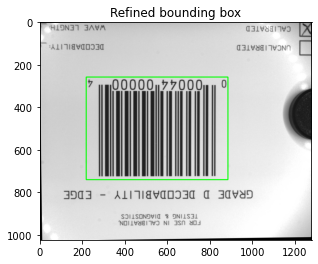

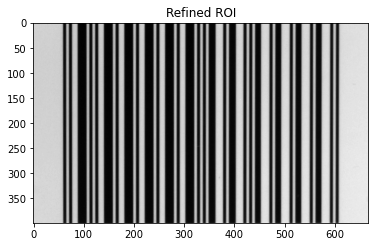

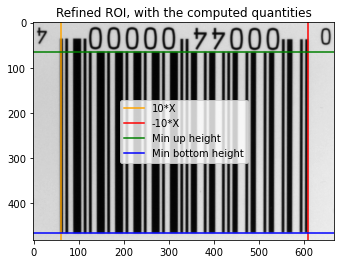

In [325]:
%%time
t = refine_roi(f'../images/{images_paths[46]}')
times.append(t)

Time for detecting the ROI: 0.04981708526611328
Time for rotating the image and the ROI: 0.01865553855895996
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06276655197143555
Time for refining the ROI: 0.048705101013183594
Overall time: 0.17994427680969238
Wall time: 180 ms


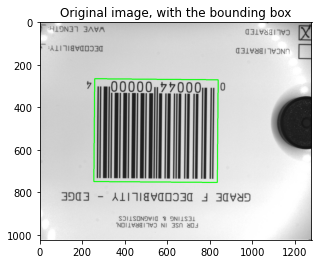

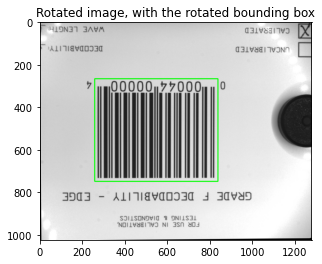

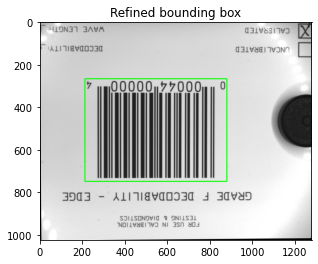

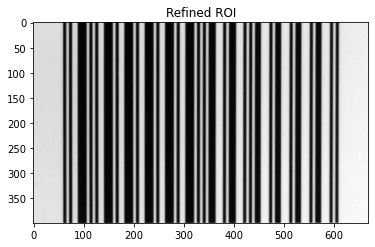

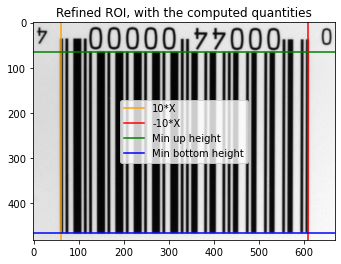

In [326]:
%%time
t = refine_roi(f'../images/{images_paths[47]}')
times.append(t)

Time for detecting the ROI: 0.052236080169677734
Time for rotating the image and the ROI: 0.017663955688476562
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06257343292236328
Time for refining the ROI: 0.04686999320983887
Overall time: 0.17934346199035645
Wall time: 179 ms


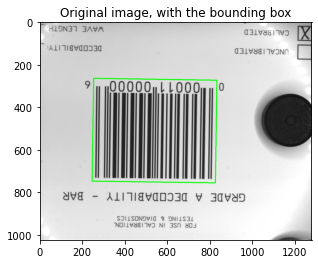

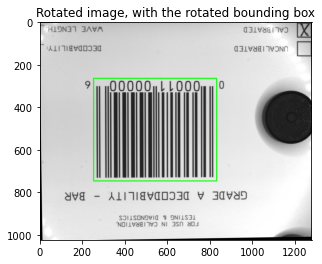

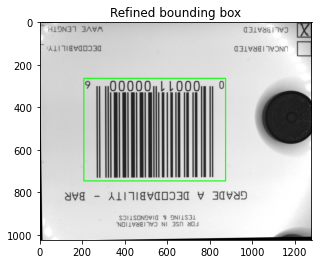

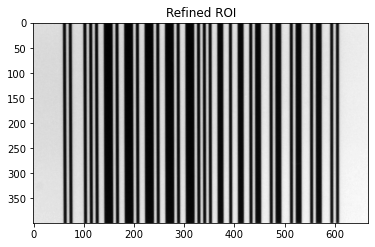

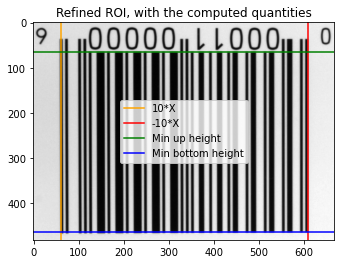

In [327]:
%%time
t = refine_roi(f'../images/{images_paths[48]}')
times.append(t)

Time for detecting the ROI: 0.050765275955200195
Time for rotating the image and the ROI: 0.03043055534362793
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06242060661315918
Time for refining the ROI: 0.04966306686401367
Overall time: 0.19327950477600098
Wall time: 193 ms


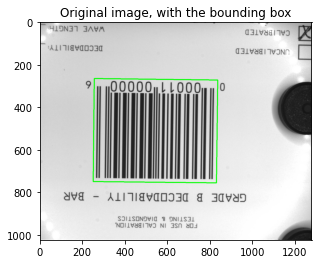

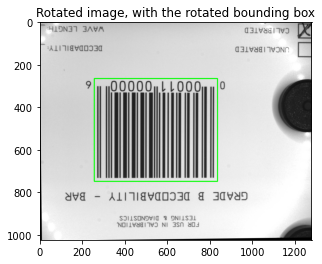

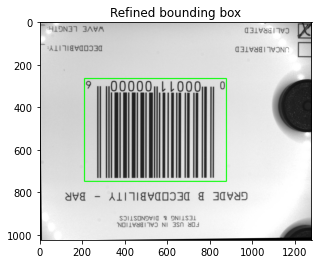

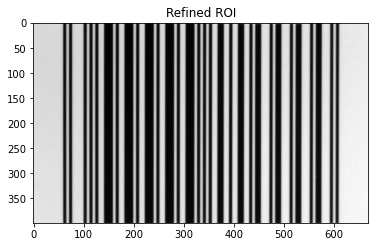

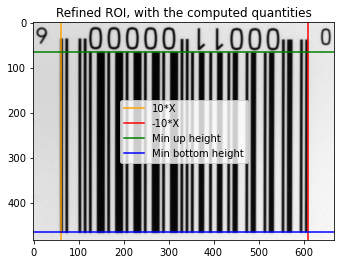

In [328]:
%%time
t = refine_roi(f'../images/{images_paths[49]}')
times.append(t)

Time for detecting the ROI: 0.04759573936462402
Time for rotating the image and the ROI: 0.03600645065307617
Time forfixing the horixontal barcode: 0.001999378204345703
Time for computing the ROI quantities: 0.06773495674133301
Time for refining the ROI: 0.04991769790649414
Overall time: 0.20125484466552734
Wall time: 202 ms


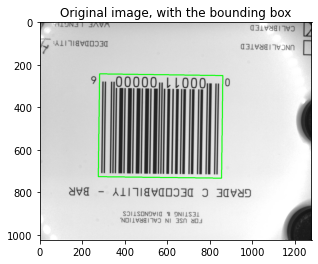

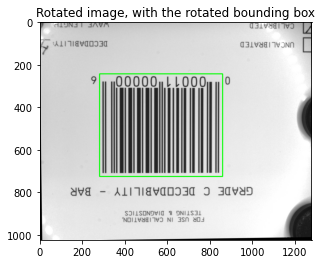

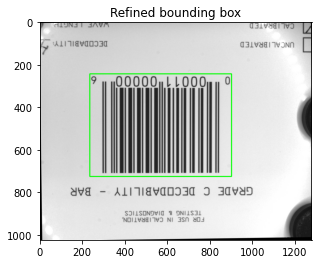

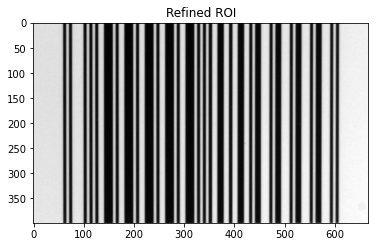

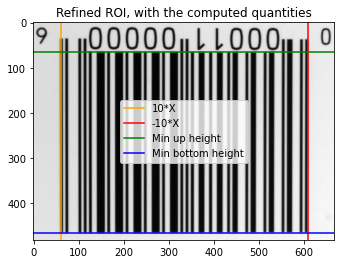

In [329]:
%%time
t = refine_roi(f'../images/{images_paths[50]}')
times.append(t)

Time for detecting the ROI: 0.050750732421875
Time for rotating the image and the ROI: 0.017795085906982422
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06310749053955078
Time for refining the ROI: 0.046869516372680664
Overall time: 0.17852282524108887
Wall time: 179 ms


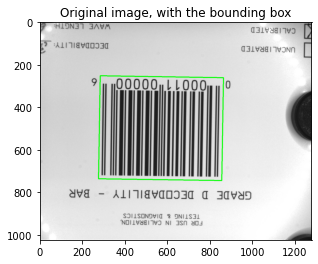

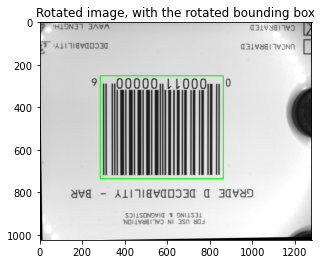

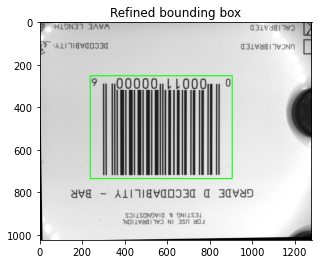

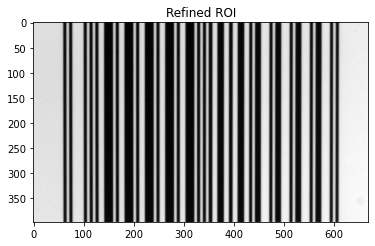

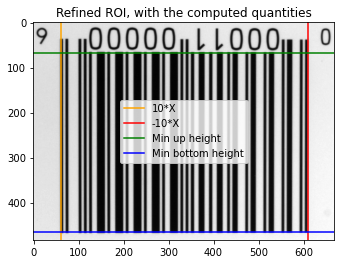

In [330]:
%%time
t = refine_roi(f'../images/{images_paths[51]}')
times.append(t)

Time for detecting the ROI: 0.05023908615112305
Time for rotating the image and the ROI: 0.019170761108398438
Time forfixing the horixontal barcode: 0.0
Time for computing the ROI quantities: 0.06313753128051758
Time for refining the ROI: 0.04687047004699707
Overall time: 0.17941784858703613
Wall time: 179 ms


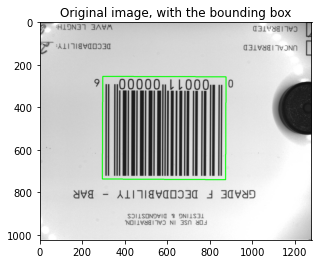

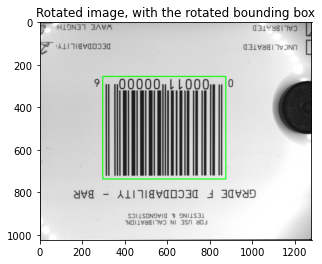

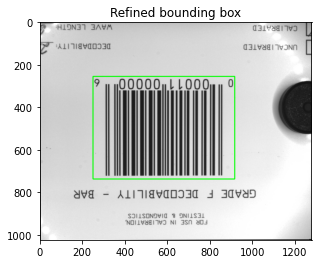

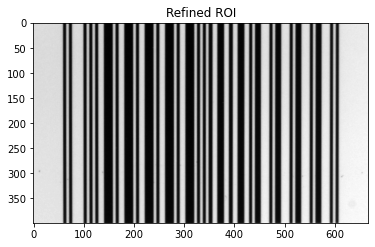

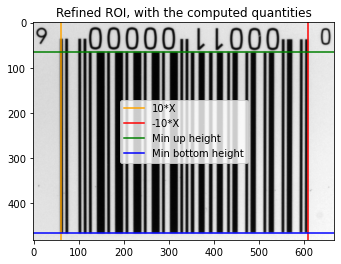

In [331]:
%%time
t = refine_roi(f'../images/{images_paths[52]}')
times.append(t)

Time for detecting the ROI: 0.01591634750366211
Time for rotating the image and the ROI: 0.014059066772460938
Time forfixing the horixontal barcode: 0.0009415149688720703
Time for computing the ROI quantities: 0.012938976287841797
Time for refining the ROI: 0.05953073501586914
Overall time: 0.10244512557983398
Wall time: 102 ms


0.10244512557983398

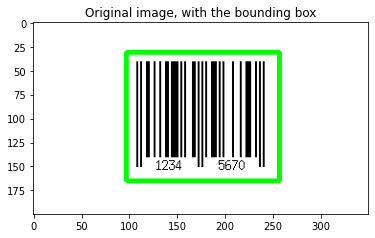

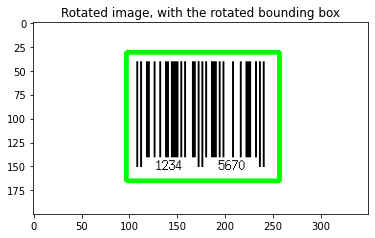

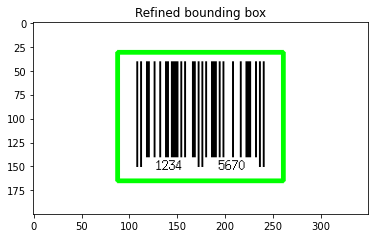

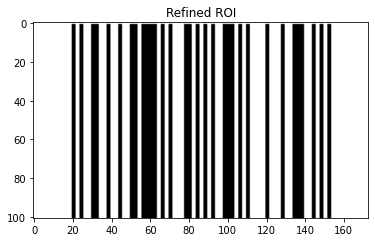

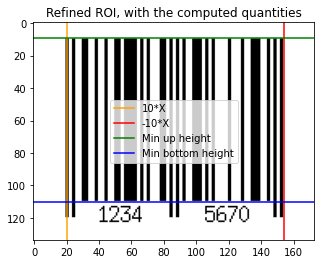

In [332]:
%%time
refine_roi('../other images/1.png')

Time for detecting the ROI: 0.06771516799926758
Time for rotating the image and the ROI: 0.02015519142150879
Time forfixing the horixontal barcode: 0.015533924102783203


IndexError: index 283 is out of bounds for axis 1 with size 283

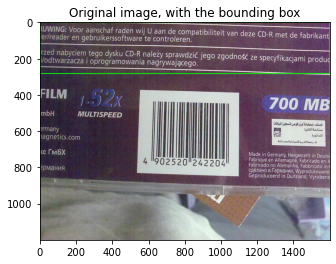

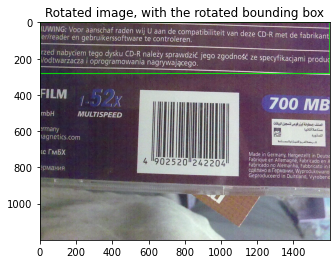

In [333]:
%%time
refine_roi('../other images/2.jpg')

Time for detecting the ROI: 0.07224011421203613
Time for rotating the image and the ROI: 0.032956838607788086
Time forfixing the horixontal barcode: 0.015795469284057617


IndexError: index 1434 is out of bounds for axis 1 with size 1434

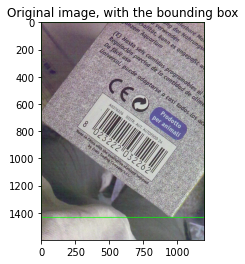

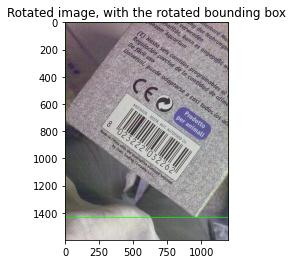

In [334]:
%%time
refine_roi('../other images/3.jpg')  # NO ROTATION INVARIANCE

### Average time (milliseconds)

In [335]:
np.mean(times)

0.1958157466008113